<a href="https://colab.research.google.com/github/Div12345/MOABB_Benchmark/blob/main/MOABB_benchmark.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Intro

Navigate through this notebook through the Table of Contents.

Benchmarking to close -
https://github.com/NeuroTechX/moabb/issues/190

Related Issues - 

- [ ] [Schirrmeister2017 dataset](https://github.com/NeuroTechX/moabb/issues/153) 
- [ ] [RAM crashes in Within Session](https://github.com/NeuroTechX/moabb/issues/241)

- [ ] MAMEM cv_split 5 not possible - All SSVEP and Filterbank SSVEP haven't been run -
https://github.com/NeuroTechX/moabb/issues/239

- [ ] dataset_search call in FBMI - 
https://github.com/NeuroTechX/moabb/issues/237

- [ ] dataset.get_data in Zhou2016 -
https://github.com/NeuroTechX/moabb/issues/236



Optional but very useful - 
- [ ] https://github.com/NeuroTechX/moabb/issues/240 

TODO/Done -
- [x] Downloading datasets
- [ ] Within Session
  - [x] LeftRightImagery
  - [x] MotorImagery 
  - [ ] FilterBankMotorImagery - 
      Only a single pipline seems to run for this
      - [ ] Munich MI # RAM
      - [ ] SCHIRRMEISTER2017 # RAM
  - [ ] SSVEP
    - [ ] MAMEM cv split
  - [ ] FilterBankSSVEP
     - [ ] Assuming same MAMEM cv split problem should be there

- [x] Cross Session
  - [x] LeftRightImagery
  - [x] MotorImagery 
  - [ ] FilterBankMotorImagery
  - [ ] SSVEP
  - [ ] FilterBankSSVEP

- [ ] Cross Subject
  - [ ] LeftRightImagery
      - [ ] RAM Crashes for GIGADB, BNCI
  - [ ] MotorImagery 
  - [ ] FilterBankSSVEP
  - [ ] SSVEP
  - [ ] FilterBankMotorImagery


In [1]:
# !pip install git+https://github.com/NeuroTechX/moabb.git
!pip install git+https://github.com/Div12345/moabb.git
# !pip install cupy

  Cloning https://github.com/Div12345/moabb.git to /tmp/pip-req-build-lbf8fo04
  Running command git clone -q https://github.com/Div12345/moabb.git /tmp/pip-req-build-lbf8fo04
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 242 kB 5.1 MB/s 
     |████████████████████████████████| 42 kB 962 kB/s 
     |████████████████████████████████| 6.9 MB 37.2 MB/s 
     |████████████████████████████████| 28.5 MB 1.3 MB/s 
     |████████████████████████████████| 23.1 MB 1.2 MB/s 
     |████████████████████████████████| 636 kB 56.2 MB/s 
  Created wheel for moabb: filename=moabb-0.4.3-py3-none-any.whl size=127977 sha256=4cb5bd0bac6a7eab7ec6edea6bd8a4c3f22d1e3bded2f21e43d54358e251a2d7
  Stored in directory: /tmp/pip-ephem-wheel-cache-zbwp_f99/wheels/3d/bf/f9/f15e99a26d0892d2fc897f86221ca418ae19206b95e512ec3e
  Created wheel for pyriemann: filename=pyriemann-0.2.7-py2.py3-none-any.whl s

In [2]:
import importlib
import logging
import os
import os.path as osp
from argparse import ArgumentParser
from collections import OrderedDict
from copy import deepcopy
from glob import glob


import pandas as pd
import yaml
from sklearn.base import BaseEstimator

import mne
from moabb import paradigms as moabb_paradigms
from moabb.analysis import analyze
from moabb.analysis.results import get_string_rep
from moabb.evaluations import CrossSessionEvaluation
from moabb.evaluations import CrossSubjectEvaluation
from moabb.evaluations import WithinSessionEvaluation
from moabb.pipelines.utils import create_pipeline_from_config
from moabb.datasets.utils import _download_all

from moabb.utils import set_download_dir
# moabb specific imports
import time

log = logging.getLogger(__name__)

In [ ]:
# !MNE_USE_CUDA=true python -c "import mne; mne.cuda.init_cuda(verbose=True)"

In [ ]:
# mne.utils.set_config('MNE_USE_CUDA', 'true')  

In [ ]:
# !pytest /usr/local/lib/python3.7/dist-packages/mne/tests/test_filter.py -k cuda

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
#@title Helper Functions

def parser_init():
    parser = ArgumentParser(description="Main run script for MOABB")

    parser.add_argument(

        "-p",

        "--pipelines",

        dest="pipelines",

        type=str,

        default="./pipelines/",

        help="Folder containing the pipelines to evaluates.",

    )

    parser.add_argument(

        "-r",

        "--results",

        dest="results",

        type=str,

        default="./results/",

        help="Folder to store the results.",

    )

    parser.add_argument(

        "-f",

        "--force-update",

        dest="force",

        action="store_true",

        default=False,

        help="Force evaluation of cached pipelines.",

    )

    parser.add_argument(

        "-v", "--verbose", dest="verbose", action="store_true", default=False

    )

    parser.add_argument(

        "-d",

        "--debug",

        dest="debug",

        action="store_true",

        default=True,

        help="Print debug level parse statements. Overrides verbose",

    )

    parser.add_argument(

        "-o",

        "--output",

        dest="output",

        type=str,

        default="./",

        help="Folder to put analysis results",

    )

    parser.add_argument(

        "--threads", dest="threads", type=int, default=-1, help="Number of threads to run"

    )

    parser.add_argument(

        "--plot",

        dest="plot",

        action="store_true",

        default=True,

        help="Plot results after computing. Defaults false",

    )

    parser.add_argument(

        "-c",

        "--contexts",

        dest="context",

        type=str,

        default=None,

        help="File path to context.yml file that describes context parameters."
             "If none, assumes all defaults. Must contain an entry for all "
             "paradigms described in the pipelines",

    )

    return parser


def parse_pipelines_from_directory(d):
    """
    Given directory, returns generated pipeline config dictionaries. Each entry
    has structure:
    'name': string
    'pipeline': sklearn.BaseEstimator
    'paradigms': list of class names that are compatible with said pipeline
    """

    assert os.path.isdir(

        os.path.abspath(d)

    ), "Given pipeline path {} is not valid".format(d)

    # get list of config files

    yaml_files = glob(os.path.join(d, "*.yml"))

    pipeline_configs = []

    for yaml_file in yaml_files:
        with open(yaml_file, "r") as _file:
            content = _file.read()

            # load config

            config_dict = yaml.load(content, Loader=yaml.FullLoader)

            ppl = create_pipeline_from_config(config_dict["pipeline"])

            pipeline_configs.append(

                {

                    "paradigms": config_dict["paradigms"],

                    "pipeline": ppl,

                    "name": config_dict["name"],

                }

            )

    # we can do the same for python defined pipeline

    python_files = glob(os.path.join(d, "*.py"))

    for python_file in python_files:
        spec = importlib.util.spec_from_file_location("custom", python_file)

        foo = importlib.util.module_from_spec(spec)

        spec.loader.exec_module(foo)

        pipeline_configs.append(foo.PIPELINE)

    return pipeline_configs


def generate_paradigms(pipeline_configs, context=None):
    context = context or {}

    paradigms = OrderedDict()

    for config in pipeline_configs:

        if "paradigms" not in config.keys():
            log.error("{} must have a 'paradigms' key.".format(config))

            continue

        # iterate over paradigms

        for paradigm in config["paradigms"]:

            # check if it is in the context parameters file

            if len(context) > 0:

                if paradigm not in context.keys():
                    log.debug(context)

                    log.warning(

                        "Paradigm {} not in context file {}".format(

                            paradigm, context.keys()

                        )

                    )

            if isinstance(config["pipeline"], BaseEstimator):

                pipeline = deepcopy(config["pipeline"])



            else:

                log.error(config["pipeline"])

                raise (ValueError("pipeline must be a sklearn estimator"))

            # append the pipeline in the paradigm list

            if paradigm not in paradigms.keys():
                paradigms[paradigm] = {}

            # FIXME name are not unique

            log.debug("Pipeline: \n\n {} \n".format(get_string_rep(pipeline)))

            paradigms[paradigm][config["name"]] = pipeline

    return paradigms

In [5]:
set_download_dir('/content/drive/MyDrive/mne_data')

Attempting to create new mne-python configuration file:
/root/.mne/mne-python.json


In [6]:
!lscpu

Architecture:        x86_64
CPU op-mode(s):      32-bit, 64-bit
Byte Order:          Little Endian
CPU(s):              4
On-line CPU(s) list: 0-3
Thread(s) per core:  2
Core(s) per socket:  2
Socket(s):           1
NUMA node(s):        1
Vendor ID:           GenuineIntel
CPU family:          6
Model:               79
Model name:          Intel(R) Xeon(R) CPU @ 2.20GHz
Stepping:            0
CPU MHz:             2199.998
BogoMIPS:            4399.99
Hypervisor vendor:   KVM
Virtualization type: full
L1d cache:           32K
L1i cache:           32K
L2 cache:            256K
L3 cache:            56320K
NUMA node0 CPU(s):   0-3
Flags:               fpu vme de pse tsc msr pae mce cx8 apic sep mtrr pge mca cmov pat pse36 clflush mmx fxsr sse sse2 ss ht syscall nx pdpe1gb rdtscp lm constant_tsc rep_good nopl xtopology nonstop_tsc cpuid tsc_known_freq pni pclmulqdq ssse3 fma cx16 pcid sse4_1 sse4_2 x2apic movbe popcnt aes xsave avx f16c rdrand hypervisor lahf_lm abm 3dnowprefetch invpcid_sin

In [14]:
mne.set_config('MOABB_RESULTS',"/content/drive/MyDrive/mne_data")
print(mne.get_config())

{'MNE_DATA': '/content/drive/MyDrive/mne_data', 'MNE_DATASETS_ALEXEEG_PATH': '/content/drive/MyDrive/mne_data', 'MNE_DATASETS_BNCI_PATH': '/content/drive/MyDrive/mne_data', 'MNE_DATASETS_EEGBCI_PATH': '/content/drive/MyDrive/mne_data', 'MNE_DATASETS_GIGADB_PATH': '/content/drive/MyDrive/mne_data', 'MNE_DATASETS_LEE2019_MI_PATH': '/content/drive/MyDrive/mne_data', 'MNE_DATASETS_MUNICHMI_PATH': '/content/drive/MyDrive/mne_data', 'MNE_DATASETS_SCHIRRMEISTER2017_PATH': '/content/drive/MyDrive/mne_data', 'MNE_DATASETS_UPPERLIMB_PATH': '/content/drive/MyDrive/mne_data', 'MOABB_RESULTS': '/content/drive/MyDrive/mne_data'}


<ipython-input-14-c6480ff852be>:1: RuntimeWarning: Setting non-standard config type: "MOABB_RESULTS"
  mne.set_config('MOABB_RESULTS',"/content/drive/MyDrive/mne_data")


The Lee datasets cause a lot of problem in downloading, get stuck quite a few times.
The BNCI dataset doesn't have a separate file path function, so it loads and processes the data even if I just want to check if the file is downloaded or download it

# Datasets Download

In [ ]:
_download_all()

/usr/local/lib/python3.7/dist-packages/moabb/datasets/download.py:53: RuntimeWarning: Setting non-standard config type: "MNE_DATASETS_ALEXEEG_PATH"
  set_config(key, get_config("MNE_DATA"))


Creating RawArray with float64 data, n_channels=26, n_times=96735
    Range : 0 ... 96734 =      0.000 ...   386.936 secs
Ready.
Creating RawArray with float64 data, n_channels=26, n_times=96735
    Range : 0 ... 96734 =      0.000 ...   386.936 secs
Ready.
Creating RawArray with float64 data, n_channels=26, n_times=96735
    Range : 0 ... 96734 =      0.000 ...   386.936 secs
Ready.
Creating RawArray with float64 data, n_channels=26, n_times=96735
    Range : 0 ... 96734 =      0.000 ...   386.936 secs
Ready.
Creating RawArray with float64 data, n_channels=26, n_times=96735
    Range : 0 ... 96734 =      0.000 ...   386.936 secs
Ready.
Creating RawArray with float64 data, n_channels=26, n_times=96735
    Range : 0 ... 96734 =      0.000 ...   386.936 secs
Ready.
Creating RawArray with float64 data, n_channels=26, n_times=96735
    Range : 0 ... 96734 =      0.000 ...   386.936 secs
Ready.
Creating RawArray with float64 data, n_channels=26, n_times=96735
    Range : 0 ... 96734 =      

SHA256 hash of downloaded file: cdf9bca4f48c61ee9c9ba998382a4e84392918c9dbc5a43f45ee0052614e25bd
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


Creating RawArray with float64 data, n_channels=10, n_times=347704
    Range : 0 ... 347703 =      0.000 ...  1358.215 secs
Ready.


SHA256 hash of downloaded file: 0023ee04e4a113231c125bcfdf59780ed95d858a5e5c0bc993701eb6c9652894
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


Creating RawArray with float64 data, n_channels=10, n_times=347704
    Range : 0 ... 347703 =      0.000 ...  1358.215 secs
Ready.


SHA256 hash of downloaded file: 820287459d83e5512e3ac00cdb25d1806b26518daba14281c61983b230f9dd9f
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


Creating RawArray with float64 data, n_channels=10, n_times=347704
    Range : 0 ... 347703 =      0.000 ...  1358.215 secs
Ready.


SHA256 hash of downloaded file: 65b14803eb38fda4910cca1103e4b527be1624155f106fe8083861bbf3e644e3
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


Creating RawArray with float64 data, n_channels=10, n_times=347704
    Range : 0 ... 347703 =      0.000 ...  1358.215 secs
Ready.


SHA256 hash of downloaded file: d372ae2c39ece0c8dded986307e70ebb7f4bdf2c5c2fa2382c8ba489fb59f200
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


Creating RawArray with float64 data, n_channels=10, n_times=347704
    Range : 0 ... 347703 =      0.000 ...  1358.215 secs
Ready.


SHA256 hash of downloaded file: 8320e78fb0d73baa03857c4976a4b4d8e605b1c9a7a4cf2e5e80e1bb6fd30337
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


Creating RawArray with float64 data, n_channels=10, n_times=347704
    Range : 0 ... 347703 =      0.000 ...  1358.215 secs
Ready.


SHA256 hash of downloaded file: 444d9da58332f58e89e7cdd39f9d9e7b0cb8ee4fd01ce03ef3ce57e53068f47c
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


Creating RawArray with float64 data, n_channels=10, n_times=347704
    Range : 0 ... 347703 =      0.000 ...  1358.215 secs
Ready.


SHA256 hash of downloaded file: 7b5d249058dcac4ad477ea8591256d51c19df384551eba82b6c88e3ae6333571
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


Creating RawArray with float64 data, n_channels=10, n_times=347704
    Range : 0 ... 347703 =      0.000 ...  1358.215 secs
Ready.


SHA256 hash of downloaded file: beddf78f1834ddef15553e32c9d18c46bc9b3fd244ef3a8e2fe362066dfb027d
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


Creating RawArray with float64 data, n_channels=18, n_times=50184
    Range : 0 ... 50183 =      0.000 ...   196.027 secs
Ready.
Creating RawArray with float64 data, n_channels=18, n_times=50184
    Range : 0 ... 50183 =      0.000 ...   196.027 secs
Ready.
Creating RawArray with float64 data, n_channels=18, n_times=50184
    Range : 0 ... 50183 =      0.000 ...   196.027 secs
Ready.


SHA256 hash of downloaded file: d6b40d723b90bb9a71127be66d7c3f66a13861cacafdb7c45efbcb8fcf9a726e
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


Creating RawArray with float64 data, n_channels=18, n_times=50184
    Range : 0 ... 50183 =      0.000 ...   196.027 secs
Ready.
Creating RawArray with float64 data, n_channels=18, n_times=50184
    Range : 0 ... 50183 =      0.000 ...   196.027 secs
Ready.
Creating RawArray with float64 data, n_channels=18, n_times=50184
    Range : 0 ... 50183 =      0.000 ...   196.027 secs
Ready.


SHA256 hash of downloaded file: a19b5a0e1e59e2aea04c6d21ad19b6cf11f7eb2074dd59617bb9effd5b30d212
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


Creating RawArray with float64 data, n_channels=18, n_times=50184
    Range : 0 ... 50183 =      0.000 ...   196.027 secs
Ready.
Creating RawArray with float64 data, n_channels=18, n_times=50184
    Range : 0 ... 50183 =      0.000 ...   196.027 secs
Ready.
Creating RawArray with float64 data, n_channels=18, n_times=50184
    Range : 0 ... 50183 =      0.000 ...   196.027 secs
Ready.


SHA256 hash of downloaded file: 3958a8fcfc65255629640a89dcd17cd8f374a8d9df2c6c7b807bfb5fae256419
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


Creating RawArray with float64 data, n_channels=18, n_times=50184
    Range : 0 ... 50183 =      0.000 ...   196.027 secs
Ready.
Creating RawArray with float64 data, n_channels=18, n_times=50184
    Range : 0 ... 50183 =      0.000 ...   196.027 secs
Ready.
Creating RawArray with float64 data, n_channels=18, n_times=50184
    Range : 0 ... 50183 =      0.000 ...   196.027 secs
Ready.


SHA256 hash of downloaded file: 46f42354ec901ea24a3a5f5a7755af7e3bedc5b3f1ac5d0094f6874f9132e53c
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


Creating RawArray with float64 data, n_channels=18, n_times=50184
    Range : 0 ... 50183 =      0.000 ...   196.027 secs
Ready.
Creating RawArray with float64 data, n_channels=18, n_times=50184
    Range : 0 ... 50183 =      0.000 ...   196.027 secs
Ready.
Creating RawArray with float64 data, n_channels=18, n_times=50184
    Range : 0 ... 50183 =      0.000 ...   196.027 secs
Ready.


SHA256 hash of downloaded file: fb8045eae01d52bff6c0d9eff3233992e579fd12d4253ea3bbb5a1e64ea19081
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


Creating RawArray with float64 data, n_channels=18, n_times=50184
    Range : 0 ... 50183 =      0.000 ...   196.027 secs
Ready.
Creating RawArray with float64 data, n_channels=18, n_times=50184
    Range : 0 ... 50183 =      0.000 ...   196.027 secs
Ready.
Creating RawArray with float64 data, n_channels=18, n_times=50184
    Range : 0 ... 50183 =      0.000 ...   196.027 secs
Ready.


SHA256 hash of downloaded file: d21a920cf252e68fb02153afbfcc6114df50d5c8b082ae48317473776866fd4d
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


Creating RawArray with float64 data, n_channels=18, n_times=50184
    Range : 0 ... 50183 =      0.000 ...   196.027 secs
Ready.
Creating RawArray with float64 data, n_channels=18, n_times=50184
    Range : 0 ... 50183 =      0.000 ...   196.027 secs
Ready.
Creating RawArray with float64 data, n_channels=18, n_times=50184
    Range : 0 ... 50183 =      0.000 ...   196.027 secs
Ready.


SHA256 hash of downloaded file: c1e9716f0c48cc78b59892a2ca6e707f66ce8c054da499f43298768e5270074b
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


Creating RawArray with float64 data, n_channels=18, n_times=50184
    Range : 0 ... 50183 =      0.000 ...   196.027 secs
Ready.
Creating RawArray with float64 data, n_channels=18, n_times=50184
    Range : 0 ... 50183 =      0.000 ...   196.027 secs
Ready.
Creating RawArray with float64 data, n_channels=18, n_times=50184
    Range : 0 ... 50183 =      0.000 ...   196.027 secs
Ready.


SHA256 hash of downloaded file: c760087eac882541b2a67fc7d0a2cd698eb9ee469687c8fa2e59ed3d10ba4d48
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


Creating RawArray with float64 data, n_channels=18, n_times=50184
    Range : 0 ... 50183 =      0.000 ...   196.027 secs
Ready.
Creating RawArray with float64 data, n_channels=18, n_times=50184
    Range : 0 ... 50183 =      0.000 ...   196.027 secs
Ready.
Creating RawArray with float64 data, n_channels=18, n_times=50184
    Range : 0 ... 50183 =      0.000 ...   196.027 secs
Ready.


SHA256 hash of downloaded file: 22361acbc546e7f0f1ef7af7789088068df1bb37bd51f00b4786975c544ddc5e
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


Creating RawArray with float64 data, n_channels=18, n_times=50184
    Range : 0 ... 50183 =      0.000 ...   196.027 secs
Ready.
Creating RawArray with float64 data, n_channels=18, n_times=50184
    Range : 0 ... 50183 =      0.000 ...   196.027 secs
Ready.
Creating RawArray with float64 data, n_channels=18, n_times=50184
    Range : 0 ... 50183 =      0.000 ...   196.027 secs
Ready.
Creating RawArray with float64 data, n_channels=14, n_times=1099541
    Range : 0 ... 1099540 =      0.000 ...  2147.539 secs
Ready.
Creating RawArray with float64 data, n_channels=14, n_times=1097390
    Range : 0 ... 1097389 =      0.000 ...  2143.338 secs
Ready.
Creating RawArray with float64 data, n_channels=14, n_times=1099541
    Range : 0 ... 1099540 =      0.000 ...  2147.539 secs
Ready.
Creating RawArray with float64 data, n_channels=14, n_times=1097314
    Range : 0 ... 1097313 =      0.000 ...  2143.189 secs
Ready.
Creating RawArray with float64 data, n_channels=14, n_times=1105300
    Range : 0

SHA256 hash of downloaded file: f542f80d2f9042901a3165265119f8d5c8b975fabeecced9c41257557e631c1d
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


Creating RawArray with float64 data, n_channels=10, n_times=65282
    Range : 0 ... 65281 =      0.000 ...   255.004 secs
Ready.
Creating RawArray with float64 data, n_channels=10, n_times=68038
    Range : 0 ... 68037 =      0.000 ...   265.770 secs
Ready.


SHA256 hash of downloaded file: d95f983f76d7d3b364031a9263ae907869e896c14e0911886230a7a961a8aaf7
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


Creating RawArray with float64 data, n_channels=10, n_times=65502
    Range : 0 ... 65501 =      0.000 ...   255.863 secs
Ready.
Creating RawArray with float64 data, n_channels=10, n_times=63830
    Range : 0 ... 63829 =      0.000 ...   249.332 secs
Ready.


SHA256 hash of downloaded file: be397a729bd6c7fedfda91e610b24428804fd74d48f51238dabab03d796dd1d2
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


Creating RawArray with float64 data, n_channels=10, n_times=61866
    Range : 0 ... 61865 =      0.000 ...   241.660 secs
Ready.
Creating RawArray with float64 data, n_channels=10, n_times=53222
    Range : 0 ... 53221 =      0.000 ...   207.895 secs
Ready.


SHA256 hash of downloaded file: 59ab90aba55fb2d7f450b8e3b2ef2e1999ac62f7ebf61e873a0dd50d11d30ca3
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


Creating RawArray with float64 data, n_channels=10, n_times=48901
    Range : 0 ... 48900 =      0.000 ...   191.016 secs
Ready.
Creating RawArray with float64 data, n_channels=10, n_times=50856
    Range : 0 ... 50855 =      0.000 ...   198.652 secs
Ready.


SHA256 hash of downloaded file: 52ec4e9876245f12a804e285de1bdae72b956f7f80f409a74e3b69bbb1425d69
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


Creating RawArray with float64 data, n_channels=10, n_times=58682
    Range : 0 ... 58681 =      0.000 ...   229.223 secs
Ready.
Creating RawArray with float64 data, n_channels=10, n_times=54768
    Range : 0 ... 54767 =      0.000 ...   213.934 secs
Ready.


SHA256 hash of downloaded file: 0a78616d301b1788e9a8c8a43f3aee3cd056f806b3be9a0c809fe85204ddffb3
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


Creating RawArray with float64 data, n_channels=10, n_times=25327
    Range : 0 ... 25326 =      0.000 ...    98.930 secs
Ready.
Creating RawArray with float64 data, n_channels=10, n_times=26687
    Range : 0 ... 26686 =      0.000 ...   104.242 secs
Ready.


SHA256 hash of downloaded file: acccbcb1af72f8efccfec344fce32e80c0b911df0768a56fe6ea531c5b8f2e41
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


Creating RawArray with float64 data, n_channels=10, n_times=28806
    Range : 0 ... 28805 =      0.000 ...   112.520 secs
Ready.
Creating RawArray with float64 data, n_channels=10, n_times=28606
    Range : 0 ... 28605 =      0.000 ...   111.738 secs
Ready.


SHA256 hash of downloaded file: 8cd781d01b64da2c57fac435a42f8e2dccc2da28905ace10e1f8d46523075972
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


Creating RawArray with float64 data, n_channels=10, n_times=28901
    Range : 0 ... 28900 =      0.000 ...   112.891 secs
Ready.
Creating RawArray with float64 data, n_channels=10, n_times=26521
    Range : 0 ... 26520 =      0.000 ...   103.594 secs
Ready.


SHA256 hash of downloaded file: d583e4d6dcb0929c564dce0b4834cf596199abbe8c64e35eeeedd9056a8ddf02
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


Creating RawArray with float64 data, n_channels=10, n_times=27940
    Range : 0 ... 27939 =      0.000 ...   109.137 secs
Ready.
Creating RawArray with float64 data, n_channels=10, n_times=25735
    Range : 0 ... 25734 =      0.000 ...   100.523 secs
Ready.


SHA256 hash of downloaded file: 7d430f54b482bfe6f412262bf629bccfaeaf18be5cb14db939c27eb5e35aa7d4
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


Creating RawArray with float64 data, n_channels=10, n_times=25587
    Range : 0 ... 25586 =      0.000 ...    99.945 secs
Ready.
Creating RawArray with float64 data, n_channels=10, n_times=25922
    Range : 0 ... 25921 =      0.000 ...   101.254 secs
Ready.
Creating RawArray with float64 data, n_channels=31, n_times=714810
    Range : 0 ... 714809 =      0.000 ...  2792.223 secs
Ready.
Creating RawArray with float64 data, n_channels=31, n_times=714606
    Range : 0 ... 714605 =      0.000 ...  2791.426 secs
Ready.
Creating RawArray with float64 data, n_channels=31, n_times=713808
    Range : 0 ... 713807 =      0.000 ...  2788.309 secs
Ready.
Creating RawArray with float64 data, n_channels=31, n_times=714218
    Range : 0 ... 714217 =      0.000 ...  2789.910 secs
Ready.
Creating RawArray with float64 data, n_channels=31, n_times=714139
    Range : 0 ... 714138 =      0.000 ...  2789.602 secs
Ready.
Creating RawArray with float64 data, n_channels=31, n_times=714037
    Range : 0 ... 71

/usr/local/lib/python3.7/dist-packages/moabb/datasets/download.py:53: RuntimeWarning: Setting non-standard config type: "MNE_DATASETS_DEMONS_PATH"
  set_config(key, get_config("MNE_DATA"))
SHA256 hash of downloaded file: 1ff9e093d2b6f37e55b1cf976556eeab415d38331f591b25571147f72002acf5
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.
/usr/local/lib/python3.7/dist-packages/moabb/datasets/download.py:53: RuntimeWarning: Setting non-standard config type: "MNE_DATASETS_EPFLP300_PATH"
  set_config(key, get_config("MNE_DATA"))
SHA256 hash of downloaded file: a493408349f2b5fc1a94f0bb5ed3f6cdcb2cdb290af7cb4c118cbc65c7ee1128
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


unzip /content/drive/MyDrive/mne_data/MNE-epflp300-data/groups/m/mm/mmspg/www/BCI/p300/subject1.zip


SHA256 hash of downloaded file: 416006f6885e948bb48c6a1d26c403a166f4ca8bf7ab44df35301be34456d958
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


unzip /content/drive/MyDrive/mne_data/MNE-epflp300-data/groups/m/mm/mmspg/www/BCI/p300/subject2.zip


SHA256 hash of downloaded file: fe8320ad804517f641562274d7958d0b2abced744db03fed0cdac9d15c8e36e3
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


unzip /content/drive/MyDrive/mne_data/MNE-epflp300-data/groups/m/mm/mmspg/www/BCI/p300/subject3.zip


SHA256 hash of downloaded file: 6c43a64ae0e6286e1d48c9acbdfc47a1b1938ceaede3bb0b9ffe6ba663b4bc5e
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


unzip /content/drive/MyDrive/mne_data/MNE-epflp300-data/groups/m/mm/mmspg/www/BCI/p300/subject4.zip


SHA256 hash of downloaded file: 7833609efb36216331805ec4e6a3839a3eea279d69b2d028b546dea6ba021125
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


unzip /content/drive/MyDrive/mne_data/MNE-epflp300-data/groups/m/mm/mmspg/www/BCI/p300/subject6.zip


SHA256 hash of downloaded file: 18595cbdc93bed4b12b9e1d76f8161c753bfb8546a7885ba5be4cd9417282df1
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


unzip /content/drive/MyDrive/mne_data/MNE-epflp300-data/groups/m/mm/mmspg/www/BCI/p300/subject7.zip


SHA256 hash of downloaded file: 020ceea17f16f1c67729a3e2ba0b6b1f86b79b3161e2ba1e6a986d615b048af4
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


unzip /content/drive/MyDrive/mne_data/MNE-epflp300-data/groups/m/mm/mmspg/www/BCI/p300/subject8.zip


SHA256 hash of downloaded file: e111efb1858c9514a8a02793d5e887196ebc6d8cdb0f13b4ef5621435d3c04ff
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


unzip /content/drive/MyDrive/mne_data/MNE-epflp300-data/groups/m/mm/mmspg/www/BCI/p300/subject9.zip


/usr/local/lib/python3.7/dist-packages/moabb/datasets/download.py:53: RuntimeWarning: Setting non-standard config type: "MNE_DATASETS_LEE2019_ERP_PATH"
  set_config(key, get_config("MNE_DATA"))
SHA256 hash of downloaded file: 8cb4217a6f72466448b8259bb8f072c25f81437c075b0619ea14686eea0848b2
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.
SHA256 hash of downloaded file: 6a1e775868b4e77518b91b32696ede5103766694577ef03de466632441e8b217
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.
SHA256 hash of downloaded file: e911d4e268dfb166c90a3ee0ec420ccd7b03df53823fa3df369f0ebbd66b07d6
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.
SHA256 hash of downloaded file: 37f8779e527c9f0da7974c3a4ec60ea869246127795e83befe7

error_temp: ignored

In [ ]:
_download_all()

Creating RawArray with float64 data, n_channels=26, n_times=96735
    Range : 0 ... 96734 =      0.000 ...   386.936 secs
Ready.
Creating RawArray with float64 data, n_channels=26, n_times=96735
    Range : 0 ... 96734 =      0.000 ...   386.936 secs
Ready.
Creating RawArray with float64 data, n_channels=26, n_times=96735
    Range : 0 ... 96734 =      0.000 ...   386.936 secs
Ready.
Creating RawArray with float64 data, n_channels=26, n_times=96735
    Range : 0 ... 96734 =      0.000 ...   386.936 secs
Ready.
Creating RawArray with float64 data, n_channels=26, n_times=96735
    Range : 0 ... 96734 =      0.000 ...   386.936 secs
Ready.
Creating RawArray with float64 data, n_channels=26, n_times=96735
    Range : 0 ... 96734 =      0.000 ...   386.936 secs
Ready.
Creating RawArray with float64 data, n_channels=26, n_times=96735
    Range : 0 ... 96734 =      0.000 ...   386.936 secs
Ready.
Creating RawArray with float64 data, n_channels=26, n_times=96735
    Range : 0 ... 96734 =      

TimeoutError: ignored

In [ ]:
from moabb.datasets import Lee2019_ERP
ds = Lee2019_ERP()
ds.download(update_path=True)

SHA256 hash of downloaded file: 65ee1c2be950ac00c3644b93918918f8b819590b8a62bb0e3e101161547df1a1
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.
SHA256 hash of downloaded file: 87cad68bde42a81904942f793bf6b64721dcdadfa0f9d4760ac38b2cc8afbc71
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.
SHA256 hash of downloaded file: d908ad0d6a58d25592e138791a0bd14f002cc971d7f4029c392522c6d8579536
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.
SHA256 hash of downloaded file: 9081ecfec642dd64930cc624fde4a3523092ecf36a1db92f2945ede689833f94
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.
SHA256 hash of downloaded file: 27c0

Since BNCI doesn't have a data_path function, it calls the loading function itself. Lot of time waste if you just want to download the data

In [ ]:
import moabb.datasets as db
from moabb.datasets.base import BaseDataset
import inspect

dataset_list_loc = []
for ds in inspect.getmembers(db, inspect.isclass):
    if issubclass(ds[1], BaseDataset):
        dataset_list_loc.append(ds[1])

print(dataset_list_loc)

[<class 'moabb.datasets.alex_mi.AlexMI'>, <class 'moabb.datasets.bnci.BNCI2014001'>, <class 'moabb.datasets.bnci.BNCI2014002'>, <class 'moabb.datasets.bnci.BNCI2014004'>, <class 'moabb.datasets.bnci.BNCI2014008'>, <class 'moabb.datasets.bnci.BNCI2014009'>, <class 'moabb.datasets.bnci.BNCI2015001'>, <class 'moabb.datasets.bnci.BNCI2015003'>, <class 'moabb.datasets.bnci.BNCI2015004'>, <class 'moabb.datasets.gigadb.Cho2017'>, <class 'moabb.datasets.neiry.DemonsP300'>, <class 'moabb.datasets.epfl.EPFLP300'>, <class 'moabb.datasets.Lee2019.Lee2019_ERP'>, <class 'moabb.datasets.Lee2019.Lee2019_MI'>, <class 'moabb.datasets.Lee2019.Lee2019_SSVEP'>, <class 'moabb.datasets.ssvep_mamem.MAMEM1'>, <class 'moabb.datasets.ssvep_mamem.MAMEM2'>, <class 'moabb.datasets.ssvep_mamem.MAMEM3'>, <class 'moabb.datasets.mpi_mi.MunichMI'>, <class 'moabb.datasets.ssvep_nakanishi.Nakanishi2015'>, <class 'moabb.datasets.upper_limb.Ofner2017'>, <class 'moabb.datasets.physionet_mi.PhysionetMI'>, <class 'moabb.datase

In [ ]:
dat_loc = [dataset_list_loc[0],*dataset_list_loc[9:]]
# dat_loc = dataset_list_loc[14]
print(len(dataset_list_loc), len(dat_loc))
print(dat_loc)

30 22
[<class 'moabb.datasets.alex_mi.AlexMI'>, <class 'moabb.datasets.gigadb.Cho2017'>, <class 'moabb.datasets.neiry.DemonsP300'>, <class 'moabb.datasets.epfl.EPFLP300'>, <class 'moabb.datasets.Lee2019.Lee2019_ERP'>, <class 'moabb.datasets.Lee2019.Lee2019_MI'>, <class 'moabb.datasets.Lee2019.Lee2019_SSVEP'>, <class 'moabb.datasets.ssvep_mamem.MAMEM1'>, <class 'moabb.datasets.ssvep_mamem.MAMEM2'>, <class 'moabb.datasets.ssvep_mamem.MAMEM3'>, <class 'moabb.datasets.mpi_mi.MunichMI'>, <class 'moabb.datasets.ssvep_nakanishi.Nakanishi2015'>, <class 'moabb.datasets.upper_limb.Ofner2017'>, <class 'moabb.datasets.physionet_mi.PhysionetMI'>, <class 'moabb.datasets.ssvep_exo.SSVEPExo'>, <class 'moabb.datasets.schirrmeister2017.Schirrmeister2017'>, <class 'moabb.datasets.bbci_eeg_fnirs.Shin2017A'>, <class 'moabb.datasets.bbci_eeg_fnirs.Shin2017B'>, <class 'moabb.datasets.ssvep_wang.Wang2016'>, <class 'moabb.datasets.Weibo2014.Weibo2014'>, <class 'moabb.datasets.Zhou2016.Zhou2016'>, <class 'moabb

remove BNCI from that list and pass it to the following implementation of _download_all()

In [ ]:
for ds in dat_loc:
  # call download
  ds().download(update_path=True, verbose=None, accept=True)

/usr/local/lib/python3.7/dist-packages/moabb/datasets/download.py:53: RuntimeWarning: Setting non-standard config type: "MNE_DATASETS_LEE2019_SSVEP_PATH"
  set_config(key, get_config("MNE_DATA"))
SHA256 hash of downloaded file: cba21402e2a1811d3cad52565187a30cb3a5dfe9abc8bbd98a358701cd7eb882
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.
SHA256 hash of downloaded file: f277bfd9a50ac580e8f752186216f078dfa96cea9e7f426d360a87261495c3be
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.
SHA256 hash of downloaded file: cef9e93726907557c7e267d47dbefab5dd41af997e590e958ebfd4f6a6eb7696
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.
SHA256 hash of downloaded file: 6a2508047b7dd26694e0ee24a022b663719ca3b724b44ca22

In [ ]:
dat_loc = dataset_list_loc[14:]
print(len(dataset_list_loc), len(dat_loc))
for i,d in enumerate(dat_loc):
  print(i,d)
# can also remove upper limb, schirrmeister
# could've also removed munich MI
# /content/drive/MyDrive/mne_data/MNE-schirrmeister2017-data/robintibor/high-gamma-dataset/raw/master/data/test
# /content/drive/MyDrive/mne_data/MNE-munichmi-data/record/1217449/files

30 16
0 <class 'moabb.datasets.Lee2019.Lee2019_SSVEP'>
1 <class 'moabb.datasets.ssvep_mamem.MAMEM1'>
2 <class 'moabb.datasets.ssvep_mamem.MAMEM2'>
3 <class 'moabb.datasets.ssvep_mamem.MAMEM3'>
4 <class 'moabb.datasets.mpi_mi.MunichMI'>
5 <class 'moabb.datasets.ssvep_nakanishi.Nakanishi2015'>
6 <class 'moabb.datasets.upper_limb.Ofner2017'>
7 <class 'moabb.datasets.physionet_mi.PhysionetMI'>
8 <class 'moabb.datasets.ssvep_exo.SSVEPExo'>
9 <class 'moabb.datasets.schirrmeister2017.Schirrmeister2017'>
10 <class 'moabb.datasets.bbci_eeg_fnirs.Shin2017A'>
11 <class 'moabb.datasets.bbci_eeg_fnirs.Shin2017B'>
12 <class 'moabb.datasets.ssvep_wang.Wang2016'>
13 <class 'moabb.datasets.Weibo2014.Weibo2014'>
14 <class 'moabb.datasets.Zhou2016.Zhou2016'>
15 <class 'moabb.datasets.braininvaders.bi2013a'>


In [ ]:
dat_loc.remove(dat_loc[9])
dat_loc.remove(dat_loc[6]) 
dat_loc.remove(dat_loc[4]) 
dat_loc.remove(dat_loc[0]) # bloody getting stuck too much

In [ ]:
for i,d in enumerate(dat_loc):
  print(i,d)

0 <class 'moabb.datasets.ssvep_mamem.MAMEM1'>
1 <class 'moabb.datasets.ssvep_mamem.MAMEM2'>
2 <class 'moabb.datasets.ssvep_mamem.MAMEM3'>
3 <class 'moabb.datasets.ssvep_nakanishi.Nakanishi2015'>
4 <class 'moabb.datasets.physionet_mi.PhysionetMI'>
5 <class 'moabb.datasets.ssvep_exo.SSVEPExo'>
6 <class 'moabb.datasets.bbci_eeg_fnirs.Shin2017A'>
7 <class 'moabb.datasets.bbci_eeg_fnirs.Shin2017B'>
8 <class 'moabb.datasets.ssvep_wang.Wang2016'>
9 <class 'moabb.datasets.Weibo2014.Weibo2014'>
10 <class 'moabb.datasets.Zhou2016.Zhou2016'>
11 <class 'moabb.datasets.braininvaders.bi2013a'>


In [ ]:
for ds in dat_loc:
  # call download
  ds().download(update_path=True, verbose=None, accept=True)

/usr/local/lib/python3.7/dist-packages/moabb/datasets/download.py:53: RuntimeWarning: Setting non-standard config type: "MNE_DATASETS_LEE2019_SSVEP_PATH"
  set_config(key, get_config("MNE_DATA"))
SHA256 hash of downloaded file: 874a7e720b2f88e2f6f4b1cb9a9f96b0f9d8f55fd9a0657534d900d6d691c8d1
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.
SHA256 hash of downloaded file: a692814e14c09bcac93c0150be064ebb4513f1d5f214116103fc6b9cb7ba4bf7
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.
SHA256 hash of downloaded file: 9329c0de77dc0a101f318842ac80282e84092a2058ea92df683fa833889661f3
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.
SHA256 hash of downloaded file: bef37c79d078fdd5703c780717a2abf507475a3a87d3af47e

error_temp: ignored

In [ ]:
for ds in dat_loc:
  # call download
  ds().download(update_path=True, verbose=None, accept=True)

SHA256 hash of downloaded file: 83e0b789eafcab7267bd09bcb8134a9b85b7758adf005af42604488e66232fd4
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.
SHA256 hash of downloaded file: be291642ba39cdbdca8d09f27b61d0eeb2a0b28545ff24678ce53ac406a098f7
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.
SHA256 hash of downloaded file: 584f2350d302f84e6ebbbe38815505968bfc6f82dcf85f9844fe74718fc0b93c
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


error_temp: ignored

In [ ]:
for ds in dat_loc:
  # call download
  ds().download(update_path=True, verbose=None, accept=True)

SHA256 hash of downloaded file: 7fa504302b975cdc7fe5781f2f3e309b7da287026e0d9f349bcaa21ab8dcccaa
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.
SHA256 hash of downloaded file: 5163af7c39b75230dda285d315bab00c85706ff364058371bf28f399108b38e4
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.
SHA256 hash of downloaded file: 9685f3c5b2bba301dd6de3c7bd4792bfd289518613d37d8f3882e2c337f28a15
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


error_temp: ignored

In [ ]:
# skipping lee ssvep - everything else remaining
for ds in dat_loc:
  # call download
  ds().download(update_path=True, verbose=None, accept=True)

/usr/local/lib/python3.7/dist-packages/moabb/datasets/download.py:53: RuntimeWarning: Setting non-standard config type: "MNE_DATASETS_MAMEM1_PATH"
  set_config(key, get_config("MNE_DATA"))
/usr/local/lib/python3.7/dist-packages/moabb/datasets/download.py:53: RuntimeWarning: Setting non-standard config type: "MNE_DATASETS_MAMEM2_PATH"
  set_config(key, get_config("MNE_DATA"))
/usr/local/lib/python3.7/dist-packages/moabb/datasets/download.py:53: RuntimeWarning: Setting non-standard config type: "MNE_DATASETS_MAMEM3_PATH"
  set_config(key, get_config("MNE_DATA"))
/usr/local/lib/python3.7/dist-packages/moabb/datasets/download.py:53: RuntimeWarning: Setting non-standard config type: "MNE_DATASETS_NAKANISHI_PATH"
  set_config(key, get_config("MNE_DATA"))
SHA256 hash of downloaded file: dea3eecb45cf9295e41b1eb1dfca0d63febf3537a0e35f5036aba5cde661c9e5
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.20M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.46M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.46M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.46M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.46M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.46M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.46M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.46M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.46M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.46M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.46M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.46M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.46M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.46M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.46M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.46M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.46M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.46M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.46M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.20M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.46M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.46M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.46M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.46M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.46M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.46M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.46M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.46M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.46M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.20M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.46M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.46M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.97M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.97M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.97M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.97M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.97M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.97M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.97M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.97M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.97M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.97M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.97M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.97M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.20M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.95M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.95M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.95M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.95M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.95M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.95M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.46M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.10M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.48M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.20M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.22M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/2.44M [00:00<?,        ?B/s]

/usr/local/lib/python3.7/dist-packages/moabb/datasets/download.py:53: RuntimeWarning: Setting non-standard config type: "MNE_DATASETS_SSVEPEXO_PATH"
  set_config(key, get_config("MNE_DATA"))
SHA256 hash of downloaded file: 462390c675d80876d2c368a4f2d5a6813818506d530a0b45b018e876137084f3
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.
SHA256 hash of downloaded file: 9727f0bde4376ec4b93ec8a9380d402eaf2d94a6d9e79776a50b9e6d00a68254
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.
SHA256 hash of downloaded file: 937398687e04ac735aa7d1c26d715d3a675fc98a53ce6df4ce1baaa5d2ea831b
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.
SHA256 hash of downloaded file: c6e21fb964a69d5c05d5b140e047166cec0054219b862d94e6cc9a

  0%|          | Downloading : 0.00/1.01G [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.01G [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/999M [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.01G [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/1.01G [00:00<?,        ?B/s]

  0%|          | Downloading : 0.00/832M [00:00<?,        ?B/s]

/usr/local/lib/python3.7/dist-packages/moabb/datasets/download.py:53: RuntimeWarning: Setting non-standard config type: "MNE_DATASETS_WANG_PATH"
  set_config(key, get_config("MNE_DATA"))
SHA256 hash of downloaded file: 95a3cf27b7e2b58962df1127b86a85d4c2c69266ab2490bb0b9cc10d14726d96
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.
SHA256 hash of downloaded file: e3e4e58b0aa2b249ca04dce33168c0f89935f67bd2c8a2d9b9ff965fc0d37a76
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.
SHA256 hash of downloaded file: 9631e5377e1275d8376d38e71b7085871417bede814a6059bf8219a17620aa12
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.
SHA256 hash of downloaded file: e23129762c7485d96b0a5a659f718f7284738e7407b15ea201a2612668

unzip /content/drive/MyDrive/mne_data/MNE-braininvaders-data/record/1494240/files/subject1.zip


SHA256 hash of downloaded file: 939a279715b2b735a9e81aba0920c799bc45f75316c215e63d90a8b8ebad79b2
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


unzip /content/drive/MyDrive/mne_data/MNE-braininvaders-data/record/1494240/files/subject2.zip


SHA256 hash of downloaded file: 8f3abe65ba46c8a9bce5fb1d06dc495fcd0705c53f82d8a7ec0543fdcb9c70c9
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


unzip /content/drive/MyDrive/mne_data/MNE-braininvaders-data/record/1494240/files/subject3.zip


SHA256 hash of downloaded file: 9390e867767a98a3d324566126f7a10c1a1b79a59b41163173f20a9861c29444
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


unzip /content/drive/MyDrive/mne_data/MNE-braininvaders-data/record/1494240/files/subject4.zip


SHA256 hash of downloaded file: cc980e776337e9691742d09b9031f97b60a50187edaad80f252ab5789ce37fcf
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


unzip /content/drive/MyDrive/mne_data/MNE-braininvaders-data/record/1494240/files/subject5.zip


SHA256 hash of downloaded file: 9b87ffb97e535b8b2a4b24dfa31cc1207c8884b4b56ee67b8181d702cff05ed7
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


unzip /content/drive/MyDrive/mne_data/MNE-braininvaders-data/record/1494240/files/subject6.zip


SHA256 hash of downloaded file: 6ba263b84cac071b30affe015702045edbf3f9d0a78c4d23c20a73da95cf66d6
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


unzip /content/drive/MyDrive/mne_data/MNE-braininvaders-data/record/1494240/files/subject7.zip


SHA256 hash of downloaded file: bf400cb7b3bf31577daef40d696baac45ba6a3a529df1d1e1ed9566f1c4a28ab
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


unzip /content/drive/MyDrive/mne_data/MNE-braininvaders-data/record/1494240/files/subject8.zip


SHA256 hash of downloaded file: b08f8b4ef98867f6a08f61f3d35420311de8b9aced5496fbfb8c0c97dd2ed545
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


unzip /content/drive/MyDrive/mne_data/MNE-braininvaders-data/record/1494240/files/subject9.zip


SHA256 hash of downloaded file: f19c4f66fa4618d4a96146160d6e0ba6f8dc8a4fc9356e8a9e02b19f4070a5ca
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


unzip /content/drive/MyDrive/mne_data/MNE-braininvaders-data/record/1494240/files/subject10.zip


SHA256 hash of downloaded file: 028d9a99abdcef540338c07f2baa294953a85ece4be94c5faa680727f14d66c8
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


unzip /content/drive/MyDrive/mne_data/MNE-braininvaders-data/record/1494240/files/subject11.zip


SHA256 hash of downloaded file: 59a7b85d8348173c3632bf67314653e204453ecfdca2fc460dbe33cf63b26fcd
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


unzip /content/drive/MyDrive/mne_data/MNE-braininvaders-data/record/1494240/files/subject12.zip


SHA256 hash of downloaded file: f460d8ef9ccdab5a23bfe42af440c3daa2327dbfd7a6b21e1bb1eed252011334
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


unzip /content/drive/MyDrive/mne_data/MNE-braininvaders-data/record/1494240/files/subject13.zip


SHA256 hash of downloaded file: d0fbd7178e2458204d0f5df166df9e94b4eec578c004929dbe06584b9d2b9fb9
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


unzip /content/drive/MyDrive/mne_data/MNE-braininvaders-data/record/1494240/files/subject14.zip


SHA256 hash of downloaded file: afa6373a8a48e41235d6a045f16329c662640c27e8eb677bce69c916dc9fb0bf
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


unzip /content/drive/MyDrive/mne_data/MNE-braininvaders-data/record/1494240/files/subject15.zip


SHA256 hash of downloaded file: edb94dc9daa554489561230f24078b8fd6d9c4851d094276b26a59fc98e9641c
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


unzip /content/drive/MyDrive/mne_data/MNE-braininvaders-data/record/1494240/files/subject16.zip


SHA256 hash of downloaded file: c12b6a5211c10acf207b71198da33d6dcd96b6d235ff81e2b2942ad1de1ce86e
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


unzip /content/drive/MyDrive/mne_data/MNE-braininvaders-data/record/1494240/files/subject17.zip


SHA256 hash of downloaded file: d85cc28b3f3f4428e2f715bbfe8e7f13ea6f4f30aff7c15e063e8fbf606c5835
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


unzip /content/drive/MyDrive/mne_data/MNE-braininvaders-data/record/1494240/files/subject18.zip


SHA256 hash of downloaded file: 29b7a4bdacc979e53d6196b731325a4af55933ce289f0b43f069b1f0a6c3c86f
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


unzip /content/drive/MyDrive/mne_data/MNE-braininvaders-data/record/1494240/files/subject19.zip


SHA256 hash of downloaded file: c7fd6e4148d521f5033567e5d249c6ef6d1fbc733791ca74442cb8f1573f3c7e
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


unzip /content/drive/MyDrive/mne_data/MNE-braininvaders-data/record/1494240/files/subject20.zip


SHA256 hash of downloaded file: d9d2c51d898c46fcddb360247d79825bfb60454c792de08af1b2fdcebf3be784
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


unzip /content/drive/MyDrive/mne_data/MNE-braininvaders-data/record/1494240/files/subject21.zip


SHA256 hash of downloaded file: a9faa778e566ac3fa0f56a100cf636cdb3c01b8affc827744f5550f7df398edd
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


unzip /content/drive/MyDrive/mne_data/MNE-braininvaders-data/record/1494240/files/subject22.zip


SHA256 hash of downloaded file: 99df6d7354b48c6788b1579b5b32675ec1bd89e6889c91e299998592cc829cce
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


unzip /content/drive/MyDrive/mne_data/MNE-braininvaders-data/record/1494240/files/subject23.zip


SHA256 hash of downloaded file: 65cf11255ea940d28556d5dd38bc48760e7a03423507b6dc24ea3fc6990a7d9a
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.


unzip /content/drive/MyDrive/mne_data/MNE-braininvaders-data/record/1494240/files/subject24.zip


In [ ]:
#continue from 23
from moabb.datasets import Lee2019_SSVEP
ds = Lee2019_SSVEP()
ds.download(update_path=True)

SHA256 hash of downloaded file: 6c18ac87b0cc904a02571090e0d84bd5f4f0e3a52016b8d8139c3c1da56f4daa
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.
SHA256 hash of downloaded file: e36c0880e081f9d266d4df120be1befc7ade002bc16cfb72a52bb9b3f5fb461f
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.
SHA256 hash of downloaded file: c1c2c870f38c817c346f4a8091db29add256e506c26f924b58cb48c98b26df6f
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.
SHA256 hash of downloaded file: ede5f53b8b273affb4fcf291ffc15be6c20649720371a10dd5c2f5722df1cf87
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.
SHA256 hash of downloaded file: 969b

error_temp: ignored

In [ ]:
# continue from 30
from moabb.datasets import Lee2019_SSVEP
ds = Lee2019_SSVEP()
ds.download(update_path=True)

SHA256 hash of downloaded file: 40e3ad631b1b23e740e30723ec772fc79bd92867d81b075784ae40124ff72208
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.
SHA256 hash of downloaded file: d4dd9bb1824dc5d4be1e64414fdda63411be4832da7d8ad46dec6015483c4207
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.
SHA256 hash of downloaded file: 0b33cfb20e893119d8819d012641f0a42794f3a07ad1d2d3c0cc00423a431420
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.
SHA256 hash of downloaded file: 71f7206e32ae1ff0a77f15aee47d04ce65a8498aba8be9f44599c1806d64e0db
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.
SHA256 hash of downloaded file: 57d0

error_temp: ignored

In [ ]:
# continue from 36 sub (tot = 54)
from moabb.datasets import Lee2019_SSVEP
ds = Lee2019_SSVEP()
ds.download(update_path=True)

SHA256 hash of downloaded file: 92f4e68effb921dd8d363a04e216f5da4f8afd1d3b0f045ceeaa1f19e6cbe8a1
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.
SHA256 hash of downloaded file: d9a876546191502e0f06af5aa48c01746a44790f3e9f61f0081976bb9ca1de2d
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.
SHA256 hash of downloaded file: 60c2315031037995f422b132cd373b589fd9dfe810d5b4520bf210511052459a
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.
SHA256 hash of downloaded file: 4c2d5ddce09d02f7ab5b0ee48dc9a293571c8c1339e6c92774b2f84858078a1e
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.
SHA256 hash of downloaded file: a1ac

error_temp: ignored

In [ ]:
# continue from 49 sub (tot = 54)
from moabb.datasets import Lee2019_SSVEP
ds = Lee2019_SSVEP()
ds.download(update_path=True)

SHA256 hash of downloaded file: 7b0921b46421f9e0ce1c3a36c20197fab85fc432ce03154c2a10fb4b87b8b7d8
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.
SHA256 hash of downloaded file: 711327c378ff75c4e95f8bb28799d7b1a702451d48d2104b8e288ce3ff4cced5
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.
SHA256 hash of downloaded file: 09fc3232b2d284bd4b0fe05411fd850aba305b3adefd2da4e19907043c6a41c9
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.
SHA256 hash of downloaded file: 776bf1b8bbd9d3b5740ba6d55fc3e4cc5384ae52c801354b3c2776d83be65772
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.
SHA256 hash of downloaded file: e3b9

Should probably keep a copy of the mne config json file on drive so that I can easily use it to load for later purposes

# Benchmark Run

In [8]:
#@title Setup paths and load paradigms, result variables
# set logs

mne.set_log_level(True)

# logging.basicConfig(level=logging.WARNING)

# print(mne.get_config("MOABB_RESULTS"))
# mne.set_config("MOABB_RESULTS", osp.join(osp.expanduser("~"), "results"))
# print(mne.get_config("MOABB_RESULTS"))

# parser = parser_init()

# options = parser.parse_args()

mne_path = "/content/drive/MyDrive/mne_data"
options = dict()
options["pipelines"] = mne_path+"/MOABB_Benchmark/pipelines/"
options["context"] = None
options["threads"] = -1
options["force"] = False
options["output"] = mne_path+"/MOABB_Benchmark/"
options["plot"] = True
pipeline_configs = parse_pipelines_from_directory(options["pipelines"])

context_params = {}

if options["context"] is not None:
    with open(options["context"], "r") as cfile:
        context_params = yaml.load(cfile.read(), Loader=yaml.FullLoader)

paradigms = generate_paradigms(pipeline_configs, context_params)

if len(context_params) == 0:

    for paradigm in paradigms:
        context_params[paradigm] = {}

all_results_ws = []

all_results_csu = []

all_results_css = []

In [ ]:
print(context_params)

{'LeftRightImagery': {}, 'MotorImagery': {}, 'FilterBankSSVEP': {}, 'SSVEP': {}, 'FilterBankMotorImagery': {}}


In [ ]:
print(paradigms)

OrderedDict([('LeftRightImagery', {'CSP + LDA': Pipeline(steps=[('covariances', Covariances(estimator='oas')),
                ('csp', CSP(nfilter=6)),
                ('lineardiscriminantanalysis', LinearDiscriminantAnalysis())]), 'Log Variance LDA': Pipeline(steps=[('logvariance', LogVariance()),
                ('lineardiscriminantanalysis', LinearDiscriminantAnalysis())]), 'CSP + SVM': Pipeline(steps=[('covariances', Covariances(estimator='oas')),
                ('csp', CSP(nfilter=6)), ('svc', SVC(kernel='linear'))]), 'MDM': Pipeline(steps=[('covariances', Covariances(estimator='oas')), ('mdm', MDM())]), 'Log Variance SVM': Pipeline(steps=[('logvariance', LogVariance()), ('svc', SVC(kernel='linear'))]), 'Tangent Space SVM': Pipeline(steps=[('covariances', Covariances(estimator='oas')),
                ('tangentspace', TangentSpace()),
                ('svc', SVC(kernel='linear'))]), 'Tangent Space LR': Pipeline(steps=[('covariances', Covariances(estimator='oas')),
               

In [ ]:
#@title Benchmark old try 1
for paradigm in paradigms:
    # get the context
    print(paradigm)
    # Trains and test for each session through 5 fold CV

    log.debug("{}: {} Within Session".format(paradigm, context_params[paradigm]))

    p = getattr(moabb_paradigms, paradigm)(**context_params[paradigm])

    context_ws = WithinSessionEvaluation(

        paradigm=p, random_state=42, n_jobs=options["threads"], overwrite=options["force"]

    )

    results_ws = context_ws.process(pipelines=paradigms[paradigm])

    all_results_ws.append(results_ws)

    # Does Leave One Session Out Cross Validation

    log.debug("{}: {} Cross Session".format(paradigm, context_params[paradigm]))

    context_css = CrossSessionEvaluation(
        paradigm=p, random_state=42, n_jobs=options["threads"], overwrite=options["force"]
    )

    results_css = context_css.process(pipelines=paradigms[paradigm])

    all_results_css.append(results_css)

    # Does Leave One Subject Out Cross Validation

    log.debug("{}: {} Cross Subject".format(paradigm, context_params[paradigm]))

    context_csu = CrossSubjectEvaluation(

        paradigm=p, random_state=42, n_jobs=options["threads"], overwrite=options["force"]

    )

    results_csu = context_csu.process(pipelines=paradigms[paradigm])

    all_results_csu.append(results_csu)

analyze(pd.concat(all_results_ws, ignore_index=True), options["output"], name="within_session", plot=options["plot"])

analyze(pd.concat(all_results_csu, ignore_index=True), options["output"], name="cross_session", plot=options["plot"])

analyze(pd.concat(all_results_css, ignore_index=True), options["output"], name="cross_subject", plot=options["plot"])


LeftRightImagery


/usr/local/lib/python3.7/dist-packages/moabb/datasets/download.py:53: RuntimeWarning: Setting non-standard config type: "MNE_DATASETS_BNCI_PATH"
  set_config(key, get_config("MNE_DATA"))
/usr/local/lib/python3.7/dist-packages/moabb/datasets/download.py:53: RuntimeWarning: Setting non-standard config type: "MNE_DATASETS_GIGADB_PATH"
  set_config(key, get_config("MNE_DATA"))
Trials demeaned and stacked with zero buffer to create continuous data -- edge effects present
Trials demeaned and stacked with zero buffer to create continuous data -- edge effects present
Trials demeaned and stacked with zero buffer to create continuous data -- edge effects present
Trials demeaned and stacked with zero buffer to create continuous data -- edge effects present
Trials demeaned and stacked with zero buffer to create continuous data -- edge effects present
Trials demeaned and stacked with zero buffer to create continuous data -- edge effects present
Trials demeaned and stacked with zero buffer to create

Creating RawArray with float64 data, n_channels=128, n_times=1225545
    Range : 0 ... 1225544 =      0.000 ...  2451.088 secs
Ready.
Creating RawArray with float64 data, n_channels=128, n_times=616535
    Range : 0 ... 616534 =      0.000 ...  1233.068 secs
Ready.
Creating RawArray with float64 data, n_channels=128, n_times=3131420
    Range : 0 ... 3131419 =      0.000 ...  6262.838 secs
Ready.
Creating RawArray with float64 data, n_channels=128, n_times=614290
    Range : 0 ... 614289 =      0.000 ...  1228.578 secs
Ready.
Creating RawArray with float64 data, n_channels=128, n_times=3347155
    Range : 0 ... 3347154 =      0.000 ...  6694.308 secs
Ready.
Creating RawArray with float64 data, n_channels=128, n_times=609030
    Range : 0 ... 609029 =      0.000 ...  1218.058 secs
Ready.
Creating RawArray with float64 data, n_channels=128, n_times=3451320
    Range : 0 ... 3451319 =      0.000 ...  6902.638 secs
Ready.
Creating RawArray with float64 data, n_channels=128, n_times=617090


AttributeError: ignored

In [ ]:
#@title Benchmark old try 2
for paradigm in paradigms:
    # get the context
    print(paradigm)
    # Trains and test for each session through 5 fold CV

    log.debug("{}: {} Within Session".format(paradigm, context_params[paradigm]))

    p = getattr(moabb_paradigms, paradigm)(**context_params[paradigm])

    context_ws = WithinSessionEvaluation(

        paradigm=p, random_state=42, n_jobs=options["threads"], overwrite=options["force"]

    )

    results_ws = context_ws.process(pipelines=paradigms[paradigm])

    all_results_ws.append(results_ws)

    # Does Leave One Session Out Cross Validation

    log.debug("{}: {} Cross Session".format(paradigm, context_params[paradigm]))

    context_css = CrossSessionEvaluation(
        paradigm=p, random_state=42, n_jobs=options["threads"], overwrite=options["force"]
    )

    results_css = context_css.process(pipelines=paradigms[paradigm])

    all_results_css.append(results_css)

    # Does Leave One Subject Out Cross Validation

    log.debug("{}: {} Cross Subject".format(paradigm, context_params[paradigm]))

    context_csu = CrossSubjectEvaluation(

        paradigm=p, random_state=42, n_jobs=options["threads"], overwrite=options["force"]

    )

    results_csu = context_csu.process(pipelines=paradigms[paradigm])

    all_results_csu.append(results_csu)

analyze(pd.concat(all_results_ws, ignore_index=True), options["output"], name="within_session", plot=options["plot"])

analyze(pd.concat(all_results_csu, ignore_index=True), options["output"], name="cross_session", plot=options["plot"])

analyze(pd.concat(all_results_css, ignore_index=True), options["output"], name="cross_subject", plot=options["plot"])


LeftRightImagery


Trial data de-meaned and concatenated with a buffer to create cont data
Trial data de-meaned and concatenated with a buffer to create cont data
Trial data de-meaned and concatenated with a buffer to create cont data
Trial data de-meaned and concatenated with a buffer to create cont data
Trial data de-meaned and concatenated with a buffer to create cont data
Trial data de-meaned and concatenated with a buffer to create cont data
Trial data de-meaned and concatenated with a buffer to create cont data
Trial data de-meaned and concatenated with a buffer to create cont data
Trial data de-meaned and concatenated with a buffer to create cont data
Trial data de-meaned and concatenated with a buffer to create cont data


Reading 0 ... 305029  =      0.000 ...  1220.116 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 430479  =      0.000 ...  1721.916 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 252599  =      0.000 ...  1010.396 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 296649  =      0.000 ...  1186.596 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/mne/io/cnt/cnt.py:241: RuntimeWarning: overflow encountered in int_scalars
  data_size // (n_samples * n_channels) not in [2, 4]):
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 233249  =      0.000 ...   932.996 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 226219  =      0.000 ...   904.876 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 227539  =      0.000 ...   910.156 secs...


/usr/local/lib/python3.7/dist-packages/mne/io/cnt/cnt.py:241: RuntimeWarning: overflow encountered in int_scalars
  data_size // (n_samples * n_channels) not in [2, 4]):
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 216079  =      0.000 ...   864.316 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 213939  =      0.000 ...   855.756 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 175269  =      0.000 ...   701.076 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 213209  =      0.000 ...   852.836 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 217659  =      0.000 ...   870.636 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 219849  =      0.000 ...   879.396 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 216709  =      0.000 ...   866.836 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 226609  =      0.000 ...   906.436 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 266929  =      0.000 ...  1067.716 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 227989  =      0.000 ...   911.956 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 222459  =      0.000 ...   889.836 secs...


/usr/local/lib/python3.7/dist-packages/mne/io/cnt/cnt.py:241: RuntimeWarning: overflow encountered in int_scalars
  data_size // (n_samples * n_channels) not in [2, 4]):
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 181339  =      0.000 ...   725.356 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 217139  =      0.000 ...   868.556 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 215399  =      0.000 ...   861.596 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 212209  =      0.000 ...   848.836 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 209799  =      0.000 ...   839.196 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 217109  =      0.000 ...   868.436 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
<moabb.datasets.gigadb.Cho2017 object at 0x7fd9358f1650> not compatible with evaluation. Removing this dataset from the list.
<moabb.datasets.mpi_mi.MunichMI object at 0x7fd935950dd0> not compatible with evaluation. Removing this dataset from the list.
<moabb.datasets.physionet_mi.PhysionetMI object at 0x7fd93585a890> not compatible with evaluation. Removing this dataset from the list.
<moabb.datasets.schirrmeister2017.Schirrmeister2017 object at 0x7fd93585ae90> not compatible with evaluation. Removing this dataset from the list.
<moabb.datasets.Weibo2014.Weibo2014 object at 0x7fd93585a050> not compatible with evaluation. Removing this dataset from the list.
/usr/local/lib/python3.7/dist-packages/moabb/datasets/download.py:53: RuntimeWarning: Setting non-standard config

Reading 0 ... 305029  =      0.000 ...  1220.116 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 430479  =      0.000 ...  1721.916 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 252599  =      0.000 ...  1010.396 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 296649  =      0.000 ...  1186.596 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/mne/io/cnt/cnt.py:241: RuntimeWarning: overflow encountered in int_scalars
  data_size // (n_samples * n_channels) not in [2, 4]):
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 233249  =      0.000 ...   932.996 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 226219  =      0.000 ...   904.876 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 227539  =      0.000 ...   910.156 secs...


/usr/local/lib/python3.7/dist-packages/mne/io/cnt/cnt.py:241: RuntimeWarning: overflow encountered in int_scalars
  data_size // (n_samples * n_channels) not in [2, 4]):
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 216079  =      0.000 ...   864.316 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 213939  =      0.000 ...   855.756 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 175269  =      0.000 ...   701.076 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 213209  =      0.000 ...   852.836 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 217659  =      0.000 ...   870.636 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 219849  =      0.000 ...   879.396 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 216709  =      0.000 ...   866.836 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 226609  =      0.000 ...   906.436 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 266929  =      0.000 ...  1067.716 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 227989  =      0.000 ...   911.956 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 222459  =      0.000 ...   889.836 secs...


/usr/local/lib/python3.7/dist-packages/mne/io/cnt/cnt.py:241: RuntimeWarning: overflow encountered in int_scalars
  data_size // (n_samples * n_channels) not in [2, 4]):
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 181339  =      0.000 ...   725.356 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 217139  =      0.000 ...   868.556 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 215399  =      0.000 ...   861.596 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 212209  =      0.000 ...   848.836 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 209799  =      0.000 ...   839.196 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 217109  =      0.000 ...   868.436 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/download.py:53: RuntimeWarning: Setting non-standard config type: "MNE_DATASETS_GIGADB_PATH"
  set_config(key, get_config("MNE_DATA"))
Trials demeaned and stacked with zero buffer to create continuous data -- edge effects present
Trials demeaned and stacked with zero buffer to create continuous data -- edge effects present
Trials demeaned and stacked with zero buffer to create continuous data -- edge effects present
Trials demeaned and stacked with zero buffer to create continuous data -- edge effects present
Trials demeaned and stacked with zero buffer to create continuous data -- edge effects present
Trials demeaned and stacked with zero buffer to create continuous data -- edge effects present
Trials demeaned and s

In [ ]:
#@title Benchmark old try 3
for paradigm in paradigms:
    # get the context
    print(paradigm)
    # Trains and test for each session through 5 fold CV

    log.debug("{}: {} Within Session".format(paradigm, context_params[paradigm]))
    print("{}: {} Within Session".format(paradigm, context_params[paradigm])

    p = getattr(moabb_paradigms, paradigm)(**context_params[paradigm])
    print(f"p {p}")

    context_ws = WithinSessionEvaluation(

        paradigm=p, random_state=42, n_jobs=options["threads"], overwrite=options["force"]

    )
    print(f"context_ws {context_ws}")

    results_ws = context_ws.process(pipelines=paradigms[paradigm])
    print(f"results_ws {results_ws}")


    all_results_ws.append(results_ws)

    # Does Leave One Session Out Cross Validation

    log.debug("{}: {} Cross Session".format(paradigm, context_params[paradigm]))
    print("{}: {} Cross Session".format(paradigm, context_params[paradigm]))

    context_css = CrossSessionEvaluation(
        paradigm=p, random_state=42, n_jobs=options["threads"], overwrite=options["force"]
    )

    results_css = context_css.process(pipelines=paradigms[paradigm])
    print("")

    all_results_css.append(results_css)

    # Does Leave One Subject Out Cross Validation

    log.debug("{}: {} Cross Subject".format(paradigm, context_params[paradigm]))

    context_csu = CrossSubjectEvaluation(

        paradigm=p, random_state=42, n_jobs=options["threads"], overwrite=options["force"]

    )

    results_csu = context_csu.process(pipelines=paradigms[paradigm])

    all_results_csu.append(results_csu)

analyze(pd.concat(all_results_ws, ignore_index=True), options["output"], name="within_session", plot=options["plot"])

analyze(pd.concat(all_results_csu, ignore_index=True), options["output"], name="cross_session", plot=options["plot"])

analyze(pd.concat(all_results_css, ignore_index=True), options["output"], name="cross_subject", plot=options["plot"])


LeftRightImagery


<moabb.datasets.gigadb.Cho2017 object at 0x7f362cf46d50> not compatible with evaluation. Removing this dataset from the list.
<moabb.datasets.mpi_mi.MunichMI object at 0x7f36349cc310> not compatible with evaluation. Removing this dataset from the list.
<moabb.datasets.physionet_mi.PhysionetMI object at 0x7f362cf5e490> not compatible with evaluation. Removing this dataset from the list.
<moabb.datasets.schirrmeister2017.Schirrmeister2017 object at 0x7f362cf36c90> not compatible with evaluation. Removing this dataset from the list.
<moabb.datasets.Weibo2014.Weibo2014 object at 0x7f362cf36710> not compatible with evaluation. Removing this dataset from the list.
Trials demeaned and stacked with zero buffer to create continuous data -- edge effects present
Trials demeaned and stacked with zero buffer to create continuous data -- edge effects present
Trials demeaned and stacked with zero buffer to create continuous data -- edge effects present
Trials demeaned and stacked with zero buffer to 

In [ ]:
print(paradigms.keys())

odict_keys(['LeftRightImagery', 'MotorImagery', 'FilterBankSSVEP', 'SSVEP', 'FilterBankMotorImagery'])


In [ ]:
del paradigms['FilterBankMotorImagery']
del paradigms['FilterBankSSVEP'] # due to mamem 
# IDK if any of simple SSVEP are running either
del paradigms['SSVEP']

# Within Session - All Runs All Paradigms Seperately

In [ ]:
#@title LeftRightImagery

In [ ]:
paradigm = "LeftRightImagery"
print(paradigm)
print(context_params[paradigm])
log.debug("{}: {} ".format(paradigm, context_params[paradigm]))
print("{}: {} ".format(paradigm, context_params[paradigm]))
p = getattr(moabb_paradigms, paradigm)(**context_params[paradigm])
print(f"p {p}")
d = p.datasets
for i,dat in enumerate(d):
  print(i,dat)


LeftRightImagery
{}
LeftRightImagery: {} 
p <moabb.paradigms.motor_imagery.LeftRightImagery object at 0x7ff8e13d4050>
0 <moabb.datasets.bnci.BNCI2014001 object at 0x7ff8e12eae90>
1 <moabb.datasets.bnci.BNCI2014004 object at 0x7ff8e12ea790>
2 <moabb.datasets.gigadb.Cho2017 object at 0x7ff8e12ea210>
3 <moabb.datasets.Lee2019.Lee2019_MI object at 0x7ff8e12ea350>
4 <moabb.datasets.mpi_mi.MunichMI object at 0x7ff8e12eaed0>
5 <moabb.datasets.physionet_mi.PhysionetMI object at 0x7ff8e12eac50>
6 <moabb.datasets.schirrmeister2017.Schirrmeister2017 object at 0x7ff8e12ea750>
7 <moabb.datasets.bbci_eeg_fnirs.Shin2017A object at 0x7ff8e12ea8d0>
8 <moabb.datasets.Weibo2014.Weibo2014 object at 0x7ff8e12eab90>
9 <moabb.datasets.Zhou2016.Zhou2016 object at 0x7ff8e12eac10>


In [ ]:
# paradigm = paradigms['LeftRightImagery']
# print(paradigm)
# for paradigm in paradigms:
paradigm = "LeftRightImagery"
print(paradigm)
print(context_params[paradigm])
log.debug("{}: {} Within Session".format(paradigm, context_params[paradigm]))
print("{}: {} Within Session".format(paradigm, context_params[paradigm]))
p = getattr(moabb_paradigms, paradigm)(**context_params[paradigm])
print(f"p {p}")
context_ws = WithinSessionEvaluation(paradigm=p, random_state=42, 
                                      n_jobs=options["threads"], 
                                      overwrite=options["force"]
                                      )
# The overwrite param here is for the results file
print(context_ws)
LRImg_results_ws = context_ws.process(pipelines=paradigms[paradigm])
print(f"{paradigm} results_ws {LRImg_results_ws}")

LeftRightImagery
{}
LeftRightImagery: {} Within Session
p <moabb.paradigms.motor_imagery.LeftRightImagery object at 0x7ff8e12ea390>
LeftRightImagery results_ws          score      time  samples  ... n_sessions    dataset           pipeline
0     0.827143  0.251110    144.0  ...          2   001-2014   Log Variance LDA
1     0.826327  0.051268    144.0  ...          2   001-2014   Log Variance LDA
2     0.639456  0.060345    144.0  ...          2   001-2014   Log Variance LDA
3     0.578299  0.048697    144.0  ...          2   001-2014   Log Variance LDA
4     0.958095  0.050990    144.0  ...          2   001-2014   Log Variance LDA
...        ...       ...      ...  ...        ...        ...                ...
3691  0.988000  0.111476    100.0  ...          3  Zhou 2016  Tangent Space SVM
3692  0.998000  0.108539    100.0  ...          3  Zhou 2016  Tangent Space SVM
3693  0.997531  0.102040     90.0  ...          3  Zhou 2016  Tangent Space SVM
3694  0.978000  0.124515    100.0  ...  

In [ ]:
pd.set_option('display.max_columns', None)

In [ ]:
print(LRImg_results_ws)

         score      time  samples subject    session  channels  n_sessions  \
0     0.827143  0.251110    144.0       1  session_E        22           2   
1     0.826327  0.051268    144.0       1  session_T        22           2   
2     0.639456  0.060345    144.0       2  session_E        22           2   
3     0.578299  0.048697    144.0       2  session_T        22           2   
4     0.958095  0.050990    144.0       3  session_E        22           2   
...        ...       ...      ...     ...        ...       ...         ...   
3691  0.988000  0.111476    100.0       3  session_1        14           3   
3692  0.998000  0.108539    100.0       3  session_2        14           3   
3693  0.997531  0.102040     90.0       4  session_0        14           3   
3694  0.978000  0.124515    100.0       4  session_1        14           3   
3695  0.962000  0.109058    100.0       4  session_2        14           3   

        dataset           pipeline  
0      001-2014   Log Vari

Pipeline names are too similar, turning off name shortening


['Log', 'CSP', 'MDM', 'CSP + SVM', 'CSP + LDA', 'Tangent', 'Log', 'Tangent']
{'CSP + LDA', 'Tangent', 'CSP', 'CSP + SVM', 'MDM', 'Log'}
NaN
NaN
NaN
NaN
NaN
NaN
NaN
NaN
NaN
NaN
NaN
NaN


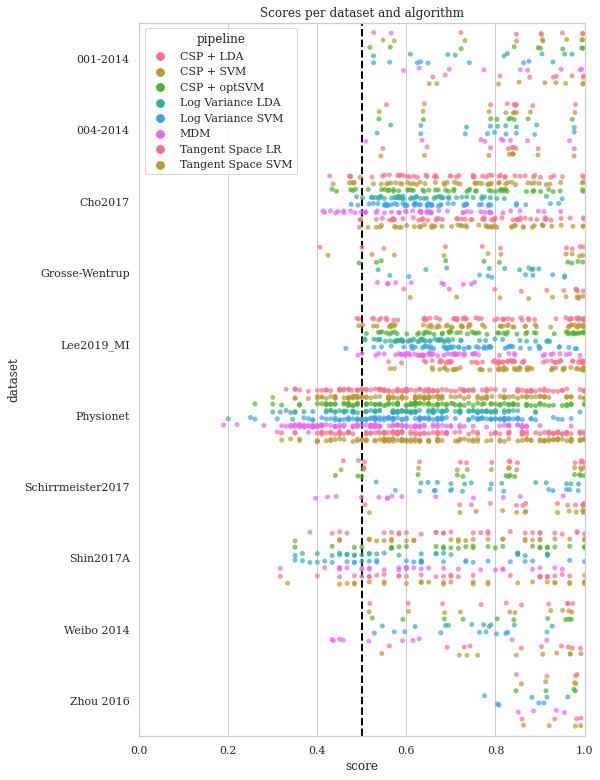

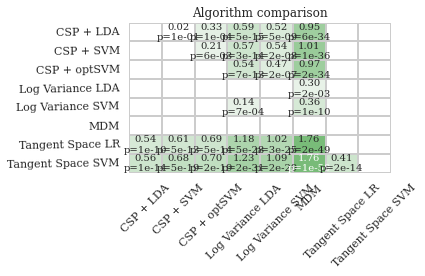

In [ ]:
analyze(LRImg_results_ws, options["output"], name="LRI_within_session", plot=options["plot"])

In [ ]:
#@title Motor Imagery

In [ ]:
paradigm = "MotorImagery"
print(paradigm)
print(context_params[paradigm])
log.debug("{}: {} ".format(paradigm, context_params[paradigm]))
print("{}: {} ".format(paradigm, context_params[paradigm]))
p = getattr(moabb_paradigms, paradigm)(**context_params[paradigm])
print(f"p {p}")
d = p.datasets
for i,dat in enumerate(d):
  print(i,dat)


Choosing from all possible events


MotorImagery
{}
MotorImagery: {} 
p <moabb.paradigms.motor_imagery.MotorImagery object at 0x7ff8e1435450>
0 <moabb.datasets.alex_mi.AlexMI object at 0x7ff8e3ea7710>
1 <moabb.datasets.bnci.BNCI2014001 object at 0x7ff8e1ba0510>
2 <moabb.datasets.bnci.BNCI2014002 object at 0x7ff8e1ba0150>
3 <moabb.datasets.bnci.BNCI2014004 object at 0x7ff8e1ba0790>
4 <moabb.datasets.bnci.BNCI2015001 object at 0x7ff8e1ba0390>
5 <moabb.datasets.bnci.BNCI2015004 object at 0x7ff8e1bbda10>
6 <moabb.datasets.gigadb.Cho2017 object at 0x7ff8e1bbdc10>
7 <moabb.datasets.Lee2019.Lee2019_MI object at 0x7ff8e1bbd790>
8 <moabb.datasets.mpi_mi.MunichMI object at 0x7ff8e1bbd350>
9 <moabb.datasets.upper_limb.Ofner2017 object at 0x7ff8e1bbd8d0>
10 <moabb.datasets.physionet_mi.PhysionetMI object at 0x7ff8e123f290>
11 <moabb.datasets.schirrmeister2017.Schirrmeister2017 object at 0x7ff8e1bbd990>
12 <moabb.datasets.bbci_eeg_fnirs.Shin2017A object at 0x7ff8e1bbd610>
13 <moabb.datasets.Weibo2014.Weibo2014 object at 0x7ff8e1bbd41

In [9]:
paradigm = "MotorImagery"
print(paradigm)
print(context_params[paradigm])
log.debug("{}: {} Within Session".format(paradigm, context_params[paradigm]))
print("{}: {} Within Session".format(paradigm, context_params[paradigm]))
p = getattr(moabb_paradigms, paradigm)(**context_params[paradigm])
print(f"p {p}")
context_ws = WithinSessionEvaluation(paradigm=p, random_state=42, 
                                      n_jobs=options["threads"], 
                                      overwrite=options["force"]
                                      )
# The overwrite param here is for the results file
print(context_ws)
MImg_results_ws = context_ws.process(pipelines=paradigms[paradigm])
print(f"{paradigm} results_ws {MImg_results_ws}")

Choosing from all possible events


MotorImagery
{}
MotorImagery: {} Within Session
p <moabb.paradigms.motor_imagery.MotorImagery object at 0x7fa17c601d50>


/usr/local/lib/python3.7/dist-packages/moabb/datasets/download.py:53: RuntimeWarning: Setting non-standard config type: "MNE_DATASETS_ALEXEEG_PATH"
  set_config(key, get_config("MNE_DATA"))
/usr/local/lib/python3.7/dist-packages/moabb/datasets/download.py:53: RuntimeWarning: Setting non-standard config type: "MNE_DATASETS_BNCI_PATH"
  set_config(key, get_config("MNE_DATA"))
/usr/local/lib/python3.7/dist-packages/moabb/datasets/download.py:53: RuntimeWarning: Setting non-standard config type: "MNE_DATASETS_GIGADB_PATH"
  set_config(key, get_config("MNE_DATA"))
Trials demeaned and stacked with zero buffer to create continuous data -- edge effects present
/usr/local/lib/python3.7/dist-packages/joblib/externals/loky/process_executor.py:691: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning
Trials demeaned and stacked with zero buffer to create continuo

Creating RawArray with float64 data, n_channels=128, n_times=1225545
    Range : 0 ... 1225544 =      0.000 ...  2451.088 secs
Ready.
Creating RawArray with float64 data, n_channels=128, n_times=616535
    Range : 0 ... 616534 =      0.000 ...  1233.068 secs
Ready.
Creating RawArray with float64 data, n_channels=128, n_times=3131420
    Range : 0 ... 3131419 =      0.000 ...  6262.838 secs
Ready.
Creating RawArray with float64 data, n_channels=128, n_times=614290
    Range : 0 ... 614289 =      0.000 ...  1228.578 secs
Ready.


/usr/local/lib/python3.7/dist-packages/joblib/externals/loky/process_executor.py:691: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning


Creating RawArray with float64 data, n_channels=128, n_times=3347155
    Range : 0 ... 3347154 =      0.000 ...  6694.308 secs
Ready.
Creating RawArray with float64 data, n_channels=128, n_times=609030
    Range : 0 ... 609029 =      0.000 ...  1218.058 secs
Ready.
Creating RawArray with float64 data, n_channels=128, n_times=3451320
    Range : 0 ... 3451319 =      0.000 ...  6902.638 secs
Ready.
Creating RawArray with float64 data, n_channels=128, n_times=617090
    Range : 0 ... 617089 =      0.000 ...  1234.178 secs
Ready.
Creating RawArray with float64 data, n_channels=128, n_times=2736300
    Range : 0 ... 2736299 =      0.000 ...  5472.598 secs
Ready.
Creating RawArray with float64 data, n_channels=128, n_times=607250
    Range : 0 ... 607249 =      0.000 ...  1214.498 secs
Ready.
Creating RawArray with float64 data, n_channels=128, n_times=3387290
    Range : 0 ... 3387289 =      0.000 ...  6774.578 secs
Ready.
Creating RawArray with float64 data, n_channels=128, n_times=615705


/usr/local/lib/python3.7/dist-packages/joblib/externals/loky/process_executor.py:691: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning


Creating RawArray with float64 data, n_channels=128, n_times=3386765
    Range : 0 ... 3386764 =      0.000 ...  6773.528 secs
Ready.
Creating RawArray with float64 data, n_channels=128, n_times=610820
    Range : 0 ... 610819 =      0.000 ...  1221.638 secs
Ready.
Creating RawArray with float64 data, n_channels=128, n_times=3385750
    Range : 0 ... 3385749 =      0.000 ...  6771.498 secs
Ready.
Creating RawArray with float64 data, n_channels=128, n_times=617735
    Range : 0 ... 617734 =      0.000 ...  1235.468 secs
Ready.
Creating RawArray with float64 data, n_channels=128, n_times=3032845
    Range : 0 ... 3032844 =      0.000 ...  6065.688 secs
Ready.
Creating RawArray with float64 data, n_channels=128, n_times=607735
    Range : 0 ... 607734 =      0.000 ...  1215.468 secs
Ready.
Creating RawArray with float64 data, n_channels=128, n_times=3345425
    Range : 0 ... 3345424 =      0.000 ...  6690.848 secs
Ready.
Creating RawArray with float64 data, n_channels=128, n_times=608505


Trial data de-meaned and concatenated with a buffer to create cont data
Trial data de-meaned and concatenated with a buffer to create cont data
Trial data de-meaned and concatenated with a buffer to create cont data
Trial data de-meaned and concatenated with a buffer to create cont data
Trial data de-meaned and concatenated with a buffer to create cont data
Trial data de-meaned and concatenated with a buffer to create cont data
Trial data de-meaned and concatenated with a buffer to create cont data
Trial data de-meaned and concatenated with a buffer to create cont data
Trial data de-meaned and concatenated with a buffer to create cont data
Trial data de-meaned and concatenated with a buffer to create cont data


Reading 0 ... 305029  =      0.000 ...  1220.116 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 430479  =      0.000 ...  1721.916 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 252599  =      0.000 ...  1010.396 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 296649  =      0.000 ...  1186.596 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/mne/io/cnt/cnt.py:241: RuntimeWarning: overflow encountered in int_scalars
  data_size // (n_samples * n_channels) not in [2, 4]):
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 233249  =      0.000 ...   932.996 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 226219  =      0.000 ...   904.876 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 227539  =      0.000 ...   910.156 secs...


/usr/local/lib/python3.7/dist-packages/mne/io/cnt/cnt.py:241: RuntimeWarning: overflow encountered in int_scalars
  data_size // (n_samples * n_channels) not in [2, 4]):
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 216079  =      0.000 ...   864.316 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 213939  =      0.000 ...   855.756 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 175269  =      0.000 ...   701.076 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 213209  =      0.000 ...   852.836 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 217659  =      0.000 ...   870.636 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 219849  =      0.000 ...   879.396 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 216709  =      0.000 ...   866.836 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 226609  =      0.000 ...   906.436 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 266929  =      0.000 ...  1067.716 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 227989  =      0.000 ...   911.956 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 222459  =      0.000 ...   889.836 secs...


/usr/local/lib/python3.7/dist-packages/mne/io/cnt/cnt.py:241: RuntimeWarning: overflow encountered in int_scalars
  data_size // (n_samples * n_channels) not in [2, 4]):
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 181339  =      0.000 ...   725.356 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 217139  =      0.000 ...   868.556 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 215399  =      0.000 ...   861.596 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 212209  =      0.000 ...   848.836 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 209799  =      0.000 ...   839.196 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 217109  =      0.000 ...   868.436 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


MotorImagery results_ws          score      time  samples  ... n_sessions    dataset           pipeline
0     0.960748  0.035572    144.0  ...          2   001-2014  DLCSPauto + shLDA
1     0.938980  0.053925    144.0  ...          2   001-2014  DLCSPauto + shLDA
2     0.497959  0.052990    144.0  ...          2   001-2014  DLCSPauto + shLDA
3     0.604014  0.052804    144.0  ...          2   001-2014  DLCSPauto + shLDA
4     0.995238  0.053281    144.0  ...          2   001-2014  DLCSPauto + shLDA
...        ...       ...      ...  ...        ...        ...                ...
2175  0.974000  0.040181    100.0  ...          3  Zhou 2016        TRCSP + LDA
2176  0.972000  0.040465    100.0  ...          3  Zhou 2016        TRCSP + LDA
2177  0.982716  0.038499     90.0  ...          3  Zhou 2016        TRCSP + LDA
2178  0.994000  0.040532    100.0  ...          3  Zhou 2016        TRCSP + LDA
2179  0.976000  0.040640    100.0  ...          3  Zhou 2016        TRCSP + LDA

[2180 rows x 9 

In [10]:
print(MImg_results_ws)

         score      time  samples  ... n_sessions    dataset           pipeline
0     0.960748  0.035572    144.0  ...          2   001-2014  DLCSPauto + shLDA
1     0.938980  0.053925    144.0  ...          2   001-2014  DLCSPauto + shLDA
2     0.497959  0.052990    144.0  ...          2   001-2014  DLCSPauto + shLDA
3     0.604014  0.052804    144.0  ...          2   001-2014  DLCSPauto + shLDA
4     0.995238  0.053281    144.0  ...          2   001-2014  DLCSPauto + shLDA
...        ...       ...      ...  ...        ...        ...                ...
2175  0.974000  0.040181    100.0  ...          3  Zhou 2016        TRCSP + LDA
2176  0.972000  0.040465    100.0  ...          3  Zhou 2016        TRCSP + LDA
2177  0.982716  0.038499     90.0  ...          3  Zhou 2016        TRCSP + LDA
2178  0.994000  0.040532    100.0  ...          3  Zhou 2016        TRCSP + LDA
2179  0.976000  0.040640    100.0  ...          3  Zhou 2016        TRCSP + LDA

[2180 rows x 9 columns]


In [ ]:
# Older run
print(MImg_results_ws)

         score      time  samples subject    session  channels  n_sessions  \
0     0.946190  0.066390    144.0       1  session_E        22           2   
1     0.929796  0.065736    144.0       1  session_T        22           2   
2     0.551020  0.065418    144.0       2  session_E        22           2   
3     0.603265  0.067247    144.0       2  session_T        22           2   
4     0.978980  0.068932    144.0       3  session_E        22           2   
...        ...       ...      ...     ...        ...       ...         ...   
2175  0.984000  0.038902    100.0       3  session_1        14           3   
2176  0.990000  0.038188    100.0       3  session_2        14           3   
2177  0.992593  0.037061     90.0       4  session_0        14           3   
2178  0.976000  0.037633    100.0       4  session_1        14           3   
2179  0.966000  0.037072    100.0       4  session_2        14           3   

        dataset           pipeline  
0      001-2014        TRC

['TRCSP', 'AM', 'TS', 'DLCSPauto']
{'DLCSPauto', 'TS', 'AM', 'TRCSP'}
NaN
NaN


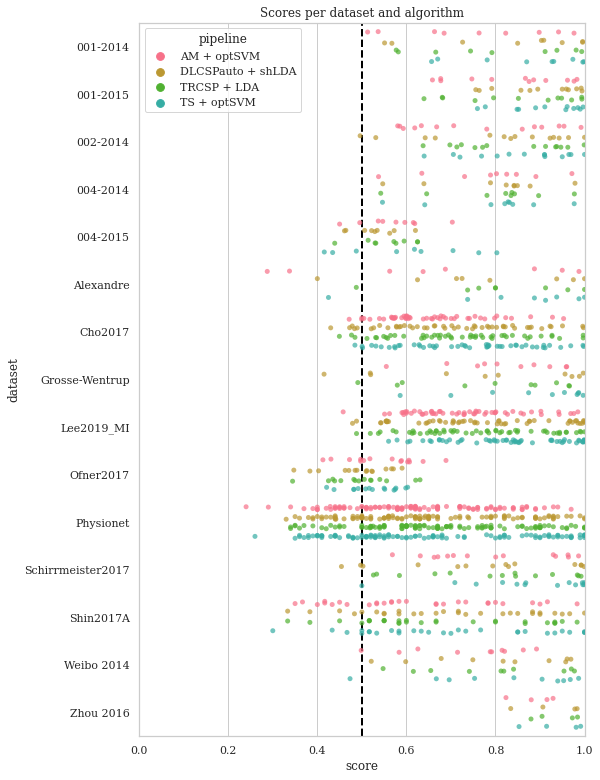

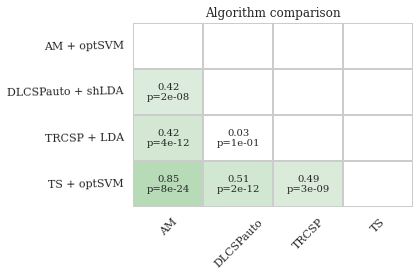

In [ ]:
analyze(MImg_results_ws, options["output"], name="MI_within_session", plot=options["plot"])

In [ ]:
print(paradigms.keys())

odict_keys(['LeftRightImagery', 'MotorImagery', 'FilterBankSSVEP', 'SSVEP', 'FilterBankMotorImagery'])


FBMI - making the edit to remove param querying n_chan to dataset search

In [ ]:
#@title FBMI

In [11]:
# Munich MI crashes FBMI - Remove and run for now - Provide list of datasets to Eval
paradigm = "FilterBankMotorImagery"
print(paradigm)
print(context_params[paradigm])
log.debug("{}: {} ".format(paradigm, context_params[paradigm]))
print("{}: {} ".format(paradigm, context_params[paradigm]))
p = getattr(moabb_paradigms, paradigm)(**context_params[paradigm])
print(f"p {p}")
d = p.datasets
for i,dat in enumerate(d):
  print(i,dat)


Choosing from all possible events


FilterBankMotorImagery
{}
FilterBankMotorImagery: {} 
p <moabb.paradigms.motor_imagery.FilterBankMotorImagery object at 0x7fa17b277f10>
0 <moabb.datasets.alex_mi.AlexMI object at 0x7fa17b277550>
1 <moabb.datasets.bnci.BNCI2014001 object at 0x7fa17b36e610>
2 <moabb.datasets.bnci.BNCI2014002 object at 0x7fa17b36e110>
3 <moabb.datasets.bnci.BNCI2014004 object at 0x7fa17b36e090>
4 <moabb.datasets.bnci.BNCI2015001 object at 0x7fa17b36e650>
5 <moabb.datasets.bnci.BNCI2015004 object at 0x7fa17b383210>
6 <moabb.datasets.gigadb.Cho2017 object at 0x7fa17b35e4d0>
7 <moabb.datasets.Lee2019.Lee2019_MI object at 0x7fa17c646850>
8 <moabb.datasets.mpi_mi.MunichMI object at 0x7fa18197ad90>
9 <moabb.datasets.upper_limb.Ofner2017 object at 0x7fa17c646350>
10 <moabb.datasets.physionet_mi.PhysionetMI object at 0x7fa17b35e690>
11 <moabb.datasets.schirrmeister2017.Schirrmeister2017 object at 0x7fa17c646c50>
12 <moabb.datasets.bbci_eeg_fnirs.Shin2017A object at 0x7fa17c646310>
13 <moabb.datasets.Weibo2014.Wei

In [12]:
d.pop(11) # SCHIRRMEISTER2017
d.pop(8) # Munich MI
for i,dat in enumerate(d):
  print(i,dat)

0 <moabb.datasets.alex_mi.AlexMI object at 0x7fa17b277550>
1 <moabb.datasets.bnci.BNCI2014001 object at 0x7fa17b36e610>
2 <moabb.datasets.bnci.BNCI2014002 object at 0x7fa17b36e110>
3 <moabb.datasets.bnci.BNCI2014004 object at 0x7fa17b36e090>
4 <moabb.datasets.bnci.BNCI2015001 object at 0x7fa17b36e650>
5 <moabb.datasets.bnci.BNCI2015004 object at 0x7fa17b383210>
6 <moabb.datasets.gigadb.Cho2017 object at 0x7fa17b35e4d0>
7 <moabb.datasets.Lee2019.Lee2019_MI object at 0x7fa17c646850>
8 <moabb.datasets.upper_limb.Ofner2017 object at 0x7fa17c646350>
9 <moabb.datasets.physionet_mi.PhysionetMI object at 0x7fa17b35e690>
10 <moabb.datasets.bbci_eeg_fnirs.Shin2017A object at 0x7fa17c646310>
11 <moabb.datasets.Weibo2014.Weibo2014 object at 0x7fa17c646690>
12 <moabb.datasets.Zhou2016.Zhou2016 object at 0x7fa17c646e10>


In [ ]:
# Seems to have crashed in SCHIRRMEISTER2017 and what is this annotations search in eegmmidb
# paradigm = paradigms['LeftRightImagery']
# print(paradigm)
# for paradigm in paradigms:

context_ws = WithinSessionEvaluation(paradigm=p, random_state=42, 
                                      n_jobs=options["threads"], 
                                      overwrite=options["force"],
                                      datasets = d
                                      )
# The overwrite param here is for the results file
print(context_ws)
FBMImg_results_ws = context_ws.process(pipelines=paradigms[paradigm])
print(f"{paradigm} results_ws {FBMImg_results_ws}")

/usr/local/lib/python3.7/dist-packages/moabb/datasets/download.py:53: RuntimeWarning: Setting non-standard config type: "MNE_DATASETS_UPPERLIMB_PATH"
  set_config(key, get_config("MNE_DATA"))
/usr/local/lib/python3.7/dist-packages/mne/io/edf/edf.py:1047: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
  etmode = np.fromstring(etmode, UINT8).tolist()[0]
/usr/local/lib/python3.7/dist-packages/mne/io/edf/edf.py:1047: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
  etmode = np.fromstring(etmode, UINT8).tolist()[0]
/usr/local/lib/python3.7/dist-packages/mne/io/edf/edf.py:1047: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
  etmode = np.fromstring(etmode, UINT8).tolist()[0]
/usr/local/lib/python3.7/dist-packages/mne/io/edf/edf.py:1047

Creating RawArray with float64 data, n_channels=128, n_times=1225545
    Range : 0 ... 1225544 =      0.000 ...  2451.088 secs
Ready.
Creating RawArray with float64 data, n_channels=128, n_times=616535
    Range : 0 ... 616534 =      0.000 ...  1233.068 secs
Ready.


In [ ]:
# SCHIRRMEISTER2017 crashes RAM
# paradigm = paradigms['LeftRightImagery']
# print(paradigm)
# for paradigm in paradigms:

context_ws = WithinSessionEvaluation(paradigm=p, random_state=42, 
                                      n_jobs=options["threads"], 
                                      overwrite=options["force"],
                                      datasets = d
                                      )
# The overwrite param here is for the results file
print(context_ws)
FBMImg_results_ws = context_ws.process(pipelines=paradigms[paradigm])
print(f"{paradigm} results_ws {FBMImg_results_ws}")


# all_results_ws.append(results_ws)

/usr/local/lib/python3.7/dist-packages/moabb/datasets/download.py:53: RuntimeWarning: Setting non-standard config type: "MNE_DATASETS_SCHIRRMEISTER2017_PATH"
  set_config(key, get_config("MNE_DATA"))


Creating RawArray with float64 data, n_channels=128, n_times=1225545
    Range : 0 ... 1225544 =      0.000 ...  2451.088 secs
Ready.
Creating RawArray with float64 data, n_channels=128, n_times=616535
    Range : 0 ... 616534 =      0.000 ...  1233.068 secs
Ready.
Creating RawArray with float64 data, n_channels=128, n_times=3131420
    Range : 0 ... 3131419 =      0.000 ...  6262.838 secs
Ready.
Creating RawArray with float64 data, n_channels=128, n_times=614290
    Range : 0 ... 614289 =      0.000 ...  1228.578 secs
Ready.


In [ ]:
paradigms[paradigm]

{'FBCSP + optSVM': Pipeline(steps=[('filterbank',
                  FilterBank(estimator=Pipeline(steps=[('covariances', Covariances(estimator='oas')), ('csp', CSP())]))),
                 ('selectkbest',
                  SelectKBest(score_func=<function mutual_info_classif at 0x7f87e869e8c0>)),
                 ('gridsearchcv',
                  GridSearchCV(estimator=SVC(kernel='linear'),
                               param_grid={'C': array([1.00000000e-02, 2.78255940e-02, 7.74263683e-02, 2.15443469e-01,
        5.99484250e-01, 1.66810054e+00, 4.64158883e+00, 1.29154967e+01,
        3.59381366e+01, 1.00000000e+02])}))])}

In [ ]:
context_ws = WithinSessionEvaluation(paradigm=p, random_state=42, 
                                      n_jobs=options["threads"], 
                                      overwrite=options["force"],
                                      datasets = d
                                      )
# The overwrite param here is for the results file
print(context_ws)
FBMImg_results_ws = context_ws.process(pipelines=paradigms[paradigm])
print(f"{paradigm} results_ws {FBMImg_results_ws}")

Trial data de-meaned and concatenated with a buffer to create cont data
/usr/local/lib/python3.7/dist-packages/joblib/externals/loky/process_executor.py:691: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning
Trial data de-meaned and concatenated with a buffer to create cont data
Trial data de-meaned and concatenated with a buffer to create cont data
Trial data de-meaned and concatenated with a buffer to create cont data
Trial data de-meaned and concatenated with a buffer to create cont data
Trial data de-meaned and concatenated with a buffer to create cont data
Trial data de-meaned and concatenated with a buffer to create cont data
Trial data de-meaned and concatenated with a buffer to create cont data
Trial data de-meaned and concatenated with a buffer to create cont data
Trial data de-meaned and concatenated with a buffer to create cont data


Reading 0 ... 305029  =      0.000 ...  1220.116 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 430479  =      0.000 ...  1721.916 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 252599  =      0.000 ...  1010.396 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 296649  =      0.000 ...  1186.596 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/mne/io/cnt/cnt.py:241: RuntimeWarning: overflow encountered in int_scalars
  data_size // (n_samples * n_channels) not in [2, 4]):
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 233249  =      0.000 ...   932.996 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 226219  =      0.000 ...   904.876 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 227539  =      0.000 ...   910.156 secs...


/usr/local/lib/python3.7/dist-packages/mne/io/cnt/cnt.py:241: RuntimeWarning: overflow encountered in int_scalars
  data_size // (n_samples * n_channels) not in [2, 4]):
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 216079  =      0.000 ...   864.316 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 213939  =      0.000 ...   855.756 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 175269  =      0.000 ...   701.076 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 213209  =      0.000 ...   852.836 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 217659  =      0.000 ...   870.636 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 219849  =      0.000 ...   879.396 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 216709  =      0.000 ...   866.836 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 226609  =      0.000 ...   906.436 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 266929  =      0.000 ...  1067.716 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 227989  =      0.000 ...   911.956 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 222459  =      0.000 ...   889.836 secs...


/usr/local/lib/python3.7/dist-packages/mne/io/cnt/cnt.py:241: RuntimeWarning: overflow encountered in int_scalars
  data_size // (n_samples * n_channels) not in [2, 4]):
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 181339  =      0.000 ...   725.356 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 217139  =      0.000 ...   868.556 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 215399  =      0.000 ...   861.596 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 212209  =      0.000 ...   848.836 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 209799  =      0.000 ...   839.196 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 217109  =      0.000 ...   868.436 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


FilterBankMotorImagery results_ws         score      time  samples  ... n_sessions    dataset        pipeline
0    0.959728  0.448374    144.0  ...          2   001-2014  FBCSP + optSVM
1    0.966871  0.440753    144.0  ...          2   001-2014  FBCSP + optSVM
2    0.529048  0.467207    144.0  ...          2   001-2014  FBCSP + optSVM
3    0.607279  0.443618    144.0  ...          2   001-2014  FBCSP + optSVM
4    0.995238  0.442830    144.0  ...          2   001-2014  FBCSP + optSVM
..        ...       ...      ...  ...        ...        ...             ...
517  0.972000  0.203751    100.0  ...          3  Zhou 2016  FBCSP + optSVM
518  0.980000  0.205539    100.0  ...          3  Zhou 2016  FBCSP + optSVM
519  0.975309  0.195441     90.0  ...          3  Zhou 2016  FBCSP + optSVM
520  0.916000  0.206598    100.0  ...          3  Zhou 2016  FBCSP + optSVM
521  0.932000  0.203661    100.0  ...          3  Zhou 2016  FBCSP + optSVM

[522 rows x 9 columns]


In [ ]:
print(FBMImg_results_ws)

        score      time  samples  ... n_sessions    dataset        pipeline
0    0.959728  0.448374    144.0  ...          2   001-2014  FBCSP + optSVM
1    0.966871  0.440753    144.0  ...          2   001-2014  FBCSP + optSVM
2    0.529048  0.467207    144.0  ...          2   001-2014  FBCSP + optSVM
3    0.607279  0.443618    144.0  ...          2   001-2014  FBCSP + optSVM
4    0.995238  0.442830    144.0  ...          2   001-2014  FBCSP + optSVM
..        ...       ...      ...  ...        ...        ...             ...
517  0.972000  0.203751    100.0  ...          3  Zhou 2016  FBCSP + optSVM
518  0.980000  0.205539    100.0  ...          3  Zhou 2016  FBCSP + optSVM
519  0.975309  0.195441     90.0  ...          3  Zhou 2016  FBCSP + optSVM
520  0.916000  0.206598    100.0  ...          3  Zhou 2016  FBCSP + optSVM
521  0.932000  0.203661    100.0  ...          3  Zhou 2016  FBCSP + optSVM

[522 rows x 9 columns]


['FBCSP']
{'FBCSP'}


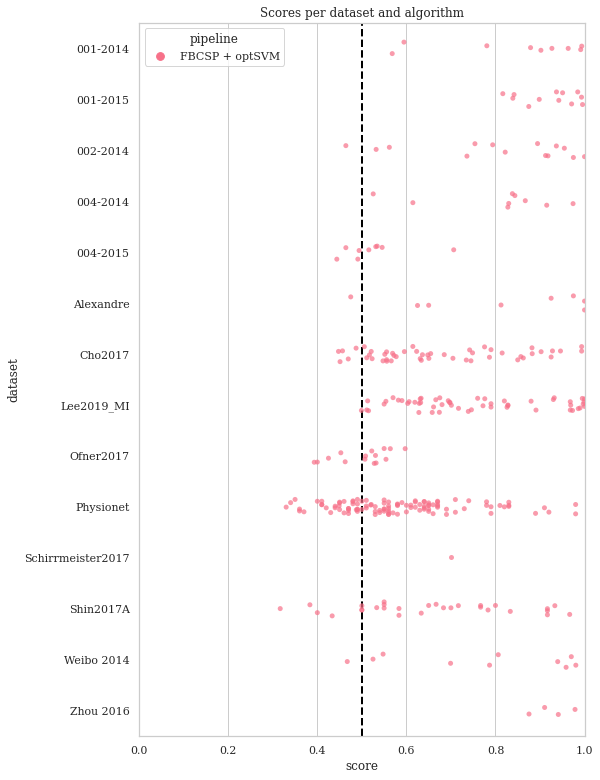

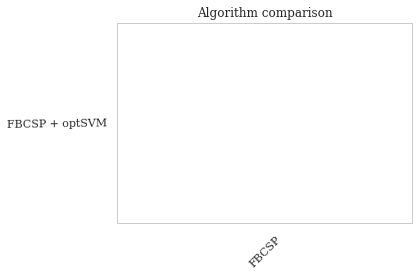

In [ ]:
analyze(FBMImg_results_ws, options["output"], name="FBMI_within_session", plot=options["plot"])

In [13]:
print(options)

{'pipelines': '/content/drive/MyDrive/mne_data/MOABB_Benchmark/pipelines/', 'context': None, 'threads': -1, 'force': False, 'output': '/content/drive/MyDrive/mne_data/MOABB_Benchmark/', 'plot': True}


In [ ]:
#@title Combine Motor Imagery

In [ ]:
# paradigm = paradigms['LeftRightImagery']
# print(paradigm)
# for paradigm in paradigms:
paradigm = "LeftRightImagery"
print(paradigm)
print(context_params[paradigm])
log.debug("{}: {} Within Session".format(paradigm, context_params[paradigm]))
print("{}: {} Within Session".format(paradigm, context_params[paradigm]))
p = getattr(moabb_paradigms, paradigm)(**context_params[paradigm])
print(f"p {p}")
context_ws = WithinSessionEvaluation(paradigm=p, random_state=42, 
                                      n_jobs=options["threads"], 
                                      overwrite=options["force"]
                                      )
# The overwrite param here is for the results file
print(context_ws)
LRImg_results_ws = context_ws.process(pipelines=paradigms[paradigm])
print(f"{paradigm} results_ws {LRImg_results_ws}")



In [ ]:
#@title SSVEP
#@markdown Change the CV to 4 - Hard coded - Raise Issue


In [ ]:
paradigm = "SSVEP"
print(paradigm)
print(context_params[paradigm])
log.debug("{}: {} Within Session".format(paradigm, context_params[paradigm]))
print("{}: {} Within Session".format(paradigm, context_params[paradigm]))
p = getattr(moabb_paradigms, paradigm)(**context_params[paradigm])
print(f"p {p}")
d = p.datasets
for i,dat in enumerate(d):
  print(i,dat)


Choosing the first None classes from all possible events


SSVEP
{}
SSVEP: {} Within Session
p <moabb.paradigms.ssvep.SSVEP object at 0x7f08d08acf10>
0 <moabb.datasets.Lee2019.Lee2019_SSVEP object at 0x7f08d1449bd0>
1 <moabb.datasets.ssvep_mamem.MAMEM1 object at 0x7f08d7beee10>
2 <moabb.datasets.ssvep_mamem.MAMEM2 object at 0x7f08d57da850>
3 <moabb.datasets.ssvep_mamem.MAMEM3 object at 0x7f08f7b6c850>
4 <moabb.datasets.ssvep_nakanishi.Nakanishi2015 object at 0x7f08d08904d0>
5 <moabb.datasets.ssvep_exo.SSVEPExo object at 0x7f08d0890c90>
6 <moabb.datasets.ssvep_wang.Wang2016 object at 0x7f08d0890e10>


In [ ]:
# MAMEM cv problem is in one all 3
d.pop(3) 
d.pop(2)
d.pop(1) 
for i,dat in enumerate(d):
  print(i,dat)

0 <moabb.datasets.Lee2019.Lee2019_SSVEP object at 0x7f08d1449bd0>
1 <moabb.datasets.ssvep_nakanishi.Nakanishi2015 object at 0x7f08d08904d0>
2 <moabb.datasets.ssvep_exo.SSVEPExo object at 0x7f08d0890c90>
3 <moabb.datasets.ssvep_wang.Wang2016 object at 0x7f08d0890e10>


In [ ]:
paradigm = "SSVEP"
print(paradigm)
print(context_params[paradigm])
log.debug("{}: {} Within Session".format(paradigm, context_params[paradigm]))
print("{}: {} Within Session".format(paradigm, context_params[paradigm]))
p = getattr(moabb_paradigms, paradigm)(**context_params[paradigm])
print(f"p {p}")
context_ws = WithinSessionEvaluation(paradigm=p, datasets = d, random_state=42, 
                                      n_jobs=options["threads"], 
                                      overwrite=options["force"]
                                      )
# The overwrite param here is for the results file
print(context_ws)
SSVEP_results_ws = context_ws.process(pipelines=paradigms[paradigm])
print(f"{paradigm} results_ws {SSVEP_results_ws}")

Choosing the first None classes from all possible events


SSVEP
{}
SSVEP: {} Within Session
p <moabb.paradigms.ssvep.SSVEP object at 0x7f08d0843490>


/usr/local/lib/python3.7/dist-packages/moabb/datasets/download.py:53: RuntimeWarning: Setting non-standard config type: "MNE_DATASETS_LEE2019_SSVEP_PATH"
  set_config(key, get_config("MNE_DATA"))
/usr/local/lib/python3.7/dist-packages/moabb/datasets/download.py:53: RuntimeWarning: Setting non-standard config type: "MNE_DATASETS_MAMEM1_PATH"
  set_config(key, get_config("MNE_DATA"))
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_split.py:672: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  % (min_groups, self.n_splits)), UserWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_split.py:672: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  % (min_groups, self.n_splits)), UserWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_split.py:672: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  

SSVEP results_ws         score      time  samples  ... n_sessions        dataset   pipeline
0    0.260000  1.744883    100.0  ...          2  Lee2019_SSVEP  SSVEP CCA
1    0.250000  1.266827    100.0  ...          2  Lee2019_SSVEP  SSVEP CCA
2    0.190000  1.291531    100.0  ...          2  Lee2019_SSVEP  SSVEP CCA
3    0.180000  1.302829    100.0  ...          2  Lee2019_SSVEP  SSVEP CCA
4    0.260000  1.271678    100.0  ...          2  Lee2019_SSVEP  SSVEP CCA
..        ...       ...      ...  ...        ...            ...        ...
300  0.041667  1.155413    240.0  ...          1     SSVEP Wang  SSVEP CCA
301  0.016667  1.185544    240.0  ...          1     SSVEP Wang  SSVEP CCA
302  0.025000  1.175373    240.0  ...          1     SSVEP Wang  SSVEP CCA
303  0.016667  1.154378    240.0  ...          1     SSVEP Wang  SSVEP CCA
304  0.041667  1.142604    240.0  ...          1     SSVEP Wang  SSVEP CCA

[305 rows x 9 columns]


In [ ]:
print(SSVEP_results_ws)

        score      time  samples  ... n_sessions        dataset   pipeline
0    0.260000  1.744883    100.0  ...          2  Lee2019_SSVEP  SSVEP CCA
1    0.250000  1.266827    100.0  ...          2  Lee2019_SSVEP  SSVEP CCA
2    0.190000  1.291531    100.0  ...          2  Lee2019_SSVEP  SSVEP CCA
3    0.180000  1.302829    100.0  ...          2  Lee2019_SSVEP  SSVEP CCA
4    0.260000  1.271678    100.0  ...          2  Lee2019_SSVEP  SSVEP CCA
..        ...       ...      ...  ...        ...            ...        ...
300  0.041667  1.155413    240.0  ...          1     SSVEP Wang  SSVEP CCA
301  0.016667  1.185544    240.0  ...          1     SSVEP Wang  SSVEP CCA
302  0.025000  1.175373    240.0  ...          1     SSVEP Wang  SSVEP CCA
303  0.016667  1.154378    240.0  ...          1     SSVEP Wang  SSVEP CCA
304  0.041667  1.142604    240.0  ...          1     SSVEP Wang  SSVEP CCA

[305 rows x 9 columns]


['SSVEP CCA']
{'SSVEP CCA'}


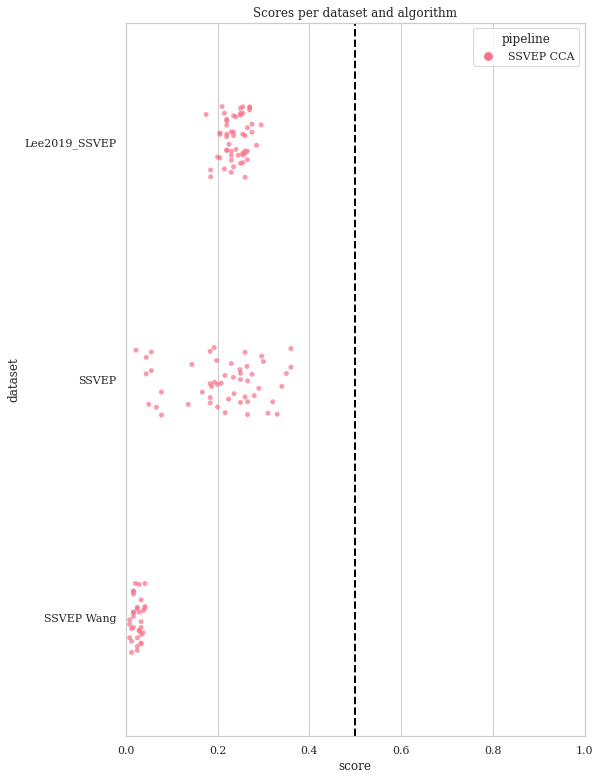

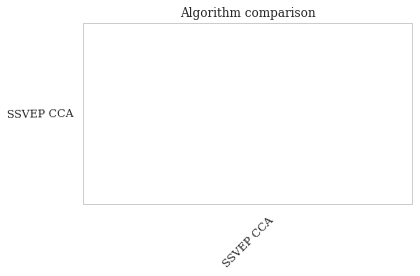

In [ ]:
analyze(SSVEP_results_ws, options["output"], name="SSVEP_within_session", plot=options["plot"])

In [ ]:
#@title FilterBank SSVEP

In [ ]:
paradigm = "FilterBankSSVEP"
print(paradigm)
print(context_params[paradigm])
log.debug("{}: {} ".format(paradigm, context_params[paradigm]))
print("{}: {} ".format(paradigm, context_params[paradigm]))
p = getattr(moabb_paradigms, paradigm)(**context_params[paradigm])
print(f"p {p}")
d = p.datasets
for i,dat in enumerate(d):
  print(i,dat)


In [ ]:
# MAMEM cv problem in all 3
d.pop(3) 
d.pop(2)
d.pop(1) 
for i,dat in enumerate(d):
  print(i,dat)

0 <moabb.datasets.Lee2019.Lee2019_SSVEP object at 0x7ff7eab910d0>
1 <moabb.datasets.ssvep_nakanishi.Nakanishi2015 object at 0x7ff7eab91290>
2 <moabb.datasets.ssvep_exo.SSVEPExo object at 0x7ff7eab91990>
3 <moabb.datasets.ssvep_wang.Wang2016 object at 0x7ff7eab91650>


In [ ]:
# crashes for something..
paradigm = "FilterBankSSVEP"
print(paradigm)
print(context_params[paradigm])
log.debug("{}: {} Within Session".format(paradigm, context_params[paradigm]))
print("{}: {} Within Session".format(paradigm, context_params[paradigm]))
p = getattr(moabb_paradigms, paradigm)(**context_params[paradigm])
print(f"p {p}")
context_ws = WithinSessionEvaluation(paradigm=p, random_state=42, 
                                      datasets = d,
                                      n_jobs=options["threads"], 
                                      overwrite=options["force"]
                                      )
# The overwrite param here is for the results file
print(context_ws)
FBSSVEP_results_ws = context_ws.process(pipelines=paradigms[paradigm])
print(f"{paradigm} results_ws {FBSSVEP_results_ws}")

Choosing the first None classes from all possible events


FilterBankSSVEP
{}
FilterBankSSVEP: {} Within Session
p <moabb.paradigms.ssvep.FilterBankSSVEP object at 0x7ff7e6359f90>


Trial data de-meaned and concatenated with a buffer to create continuous data


In [ ]:
print(FBSSVEP_results_ws)

NameError: ignored

In [ ]:
analyze(FBSSVEP_results_ws, options["output"], name="FBSSVEP_within_session", plot=options["plot"])

NameError: ignored

In [ ]:
#@title Combine SSVEP

# Cross Session

In [ ]:
pd.set_option('display.max_columns', None)

In [ ]:
#@title LeftRightImagery

In [ ]:
paradigm = "LeftRightImagery"
print(paradigm)
print(context_params[paradigm])
log.debug("{}: {} Cross Session".format(paradigm, context_params[paradigm]))
print("{}: {} Cross Session".format(paradigm, context_params[paradigm]))
p = getattr(moabb_paradigms, paradigm)(**context_params[paradigm])
print(f"p {p}")
context_css = CrossSessionEvaluation(paradigm=p, random_state=42, 
                                      n_jobs=options["threads"], 
                                      overwrite=options["force"]
                                      )
# The overwrite param here is for the results file
print(context_css)
LRImg_results_css = context_css.process(pipelines=paradigms[paradigm])
print(f"{paradigm} results_css {LRImg_results_css}")


# all_results_ws.append(results_ws)

<moabb.datasets.gigadb.Cho2017 object at 0x7f87d5ff35d0> not compatible with evaluation. Removing this dataset from the list.
<moabb.datasets.mpi_mi.MunichMI object at 0x7f87d5fcff10> not compatible with evaluation. Removing this dataset from the list.
<moabb.datasets.physionet_mi.PhysionetMI object at 0x7f87d5ff3550> not compatible with evaluation. Removing this dataset from the list.
<moabb.datasets.schirrmeister2017.Schirrmeister2017 object at 0x7f87d5ff3490> not compatible with evaluation. Removing this dataset from the list.
<moabb.datasets.Weibo2014.Weibo2014 object at 0x7f87d5ff3050> not compatible with evaluation. Removing this dataset from the list.


LeftRightImagery
{}
LeftRightImagery: {} Cross Session
p <moabb.paradigms.motor_imagery.LeftRightImagery object at 0x7f87d5fcfa90>
LeftRightImagery results_css          score      time  samples subject    session  channels  n_sessions  \
0     0.800154  0.065943    144.0       1  session_E        22           2   
1     0.782022  0.063242    144.0       1  session_T        22           2   
2     0.461227  0.061899    144.0       2  session_E        22           2   
3     0.583140  0.060256    144.0       2  session_T        22           2   
4     0.944252  0.064510    144.0       3  session_E        22           2   
...        ...       ...      ...     ...        ...       ...         ...   
2155  0.963200  0.644836    200.0       3  session_1        14           3   
2156  0.970400  0.712238    200.0       3  session_2        14           3   
2157  0.992593  0.723090    200.0       4  session_0        14           3   
2158  0.982800  0.610387    190.0       4  session_1        

In [ ]:
print(LRImg_results_css)

         score      time  samples subject    session  channels  n_sessions  \
0     0.800154  0.065943    144.0       1  session_E        22           2   
1     0.782022  0.063242    144.0       1  session_T        22           2   
2     0.461227  0.061899    144.0       2  session_E        22           2   
3     0.583140  0.060256    144.0       2  session_T        22           2   
4     0.944252  0.064510    144.0       3  session_E        22           2   
...        ...       ...      ...     ...        ...       ...         ...   
2155  0.963200  0.644836    200.0       3  session_1        14           3   
2156  0.970400  0.712238    200.0       3  session_2        14           3   
2157  0.992593  0.723090    200.0       4  session_0        14           3   
2158  0.982800  0.610387    190.0       4  session_1        14           3   
2159  0.982800  0.724348    190.0       4  session_2        14           3   

        dataset           pipeline  
0      001-2014   Log Vari

Pipeline names are too similar, turning off name shortening


['Log', 'CSP', 'MDM', 'CSP + SVM', 'CSP + LDA', 'Tangent', 'Log', 'Tangent']
{'CSP', 'CSP + LDA', 'Tangent', 'CSP + SVM', 'MDM', 'Log'}


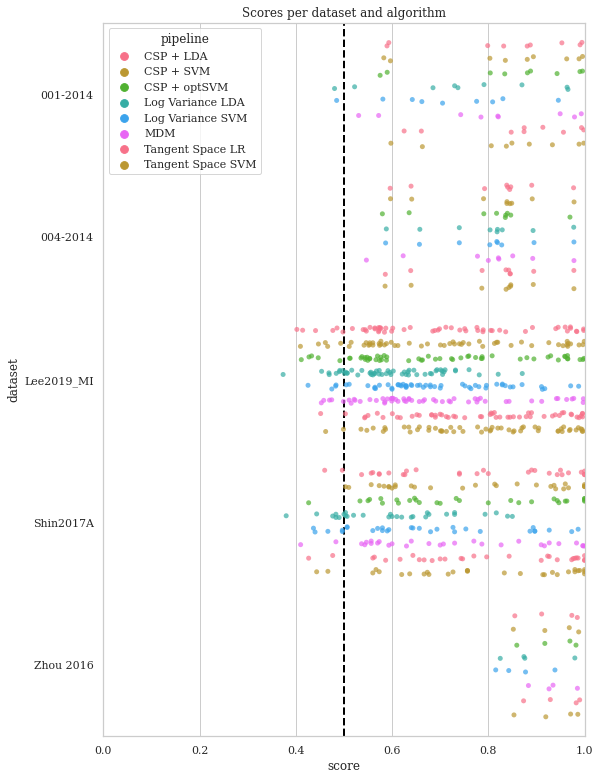

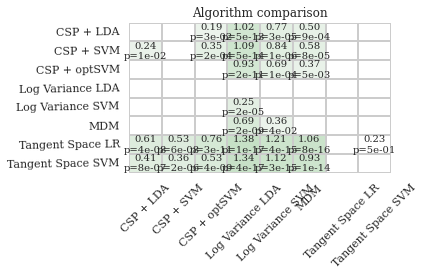

In [ ]:
analyze(LRImg_results_css, options["output"], name="LRI_cross_session", plot=options["plot"])

In [ ]:
#@title Motor Imagery

In [ ]:
# paradigm = paradigms['LeftRightImagery']
# print(paradigm)
# for paradigm in paradigms:
paradigm = "MotorImagery"
print(paradigm)
print(context_params[paradigm])
log.debug("{}: {} Cross Session".format(paradigm, context_params[paradigm]))
print("{}: {} Cross Session".format(paradigm, context_params[paradigm]))
p = getattr(moabb_paradigms, paradigm)(**context_params[paradigm])
print(f"p {p}")
context_css = CrossSessionEvaluation(paradigm=p, random_state=42, 
                                      n_jobs=options["threads"], 
                                      overwrite=options["force"]
                                      )
# The overwrite param here is for the results file
print(context_css)
MImg_results_css = context_css.process(pipelines=paradigms[paradigm])
print(f"{paradigm} results_css {MImg_results_css}")


# all_results_ws.append(results_ws)

Choosing from all possible events
<moabb.datasets.alex_mi.AlexMI object at 0x7f87dbf1d690> not compatible with evaluation. Removing this dataset from the list.
<moabb.datasets.bnci.BNCI2014002 object at 0x7f87dbf14e90> not compatible with evaluation. Removing this dataset from the list.
<moabb.datasets.gigadb.Cho2017 object at 0x7f87dbf14c90> not compatible with evaluation. Removing this dataset from the list.
<moabb.datasets.mpi_mi.MunichMI object at 0x7f87dbf14ed0> not compatible with evaluation. Removing this dataset from the list.
<moabb.datasets.upper_limb.Ofner2017 object at 0x7f87dbf14050> not compatible with evaluation. Removing this dataset from the list.
<moabb.datasets.physionet_mi.PhysionetMI object at 0x7f87dbf14350> not compatible with evaluation. Removing this dataset from the list.
<moabb.datasets.schirrmeister2017.Schirrmeister2017 object at 0x7f87dbf14190> not compatible with evaluation. Removing this dataset from the list.
<moabb.datasets.Weibo2014.Weibo2014 object a

MotorImagery
{}
MotorImagery: {} Cross Session
p <moabb.paradigms.motor_imagery.MotorImagery object at 0x7f87dbecfa10>


/usr/local/lib/python3.7/dist-packages/moabb/datasets/download.py:53: RuntimeWarning: Setting non-standard config type: "MNE_DATASETS_BNCI_PATH"
  set_config(key, get_config("MNE_DATA"))
/usr/local/lib/python3.7/dist-packages/moabb/datasets/download.py:53: RuntimeWarning: Setting non-standard config type: "MNE_DATASETS_LEE2019_MI_PATH"
  set_config(key, get_config("MNE_DATA"))


Reading 0 ... 305029  =      0.000 ...  1220.116 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 430479  =      0.000 ...  1721.916 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 252599  =      0.000 ...  1010.396 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 296649  =      0.000 ...  1186.596 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/mne/io/cnt/cnt.py:241: RuntimeWarning: overflow encountered in int_scalars
  data_size // (n_samples * n_channels) not in [2, 4]):
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 233249  =      0.000 ...   932.996 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 226219  =      0.000 ...   904.876 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 227539  =      0.000 ...   910.156 secs...


/usr/local/lib/python3.7/dist-packages/mne/io/cnt/cnt.py:241: RuntimeWarning: overflow encountered in int_scalars
  data_size // (n_samples * n_channels) not in [2, 4]):
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 216079  =      0.000 ...   864.316 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 213939  =      0.000 ...   855.756 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 175269  =      0.000 ...   701.076 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 213209  =      0.000 ...   852.836 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 217659  =      0.000 ...   870.636 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 219849  =      0.000 ...   879.396 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 216709  =      0.000 ...   866.836 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 226609  =      0.000 ...   906.436 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 266929  =      0.000 ...  1067.716 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 227989  =      0.000 ...   911.956 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 222459  =      0.000 ...   889.836 secs...


/usr/local/lib/python3.7/dist-packages/mne/io/cnt/cnt.py:241: RuntimeWarning: overflow encountered in int_scalars
  data_size // (n_samples * n_channels) not in [2, 4]):
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 181339  =      0.000 ...   725.356 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 217139  =      0.000 ...   868.556 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 215399  =      0.000 ...   861.596 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 212209  =      0.000 ...   848.836 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 209799  =      0.000 ...   839.196 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 217109  =      0.000 ...   868.436 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


MotorImagery results_css          score      time  samples subject    session  channels  n_sessions  \
0     0.934414  0.098253    144.0       1  session_E        22           2   
1     0.922454  0.088116    144.0       1  session_T        22           2   
2     0.455054  0.080337    144.0       2  session_E        22           2   
3     0.582369  0.086498    144.0       2  session_T        22           2   
4     0.981867  0.110443    144.0       3  session_E        22           2   
...        ...       ...      ...     ...        ...       ...         ...   
1259  0.988400  0.100558    200.0       3  session_1        14           3   
1260  0.975600  0.110680    200.0       3  session_2        14           3   
1261  0.973333  0.090571    200.0       4  session_0        14           3   
1262  0.950800  0.080560    190.0       4  session_1        14           3   
1263  0.981600  0.093565    190.0       4  session_2        14           3   

        dataset           pipeline  
0

In [ ]:
print(MImg_results_css)

         score      time  samples subject    session  channels  n_sessions  \
0     0.934414  0.098253    144.0       1  session_E        22           2   
1     0.922454  0.088116    144.0       1  session_T        22           2   
2     0.455054  0.080337    144.0       2  session_E        22           2   
3     0.582369  0.086498    144.0       2  session_T        22           2   
4     0.981867  0.110443    144.0       3  session_E        22           2   
...        ...       ...      ...     ...        ...       ...         ...   
1259  0.988400  0.100558    200.0       3  session_1        14           3   
1260  0.975600  0.110680    200.0       3  session_2        14           3   
1261  0.973333  0.090571    200.0       4  session_0        14           3   
1262  0.950800  0.080560    190.0       4  session_1        14           3   
1263  0.981600  0.093565    190.0       4  session_2        14           3   

        dataset           pipeline  
0      001-2014        TRC

['TRCSP', 'AM', 'TS', 'DLCSPauto']
{'AM', 'TRCSP', 'TS', 'DLCSPauto'}


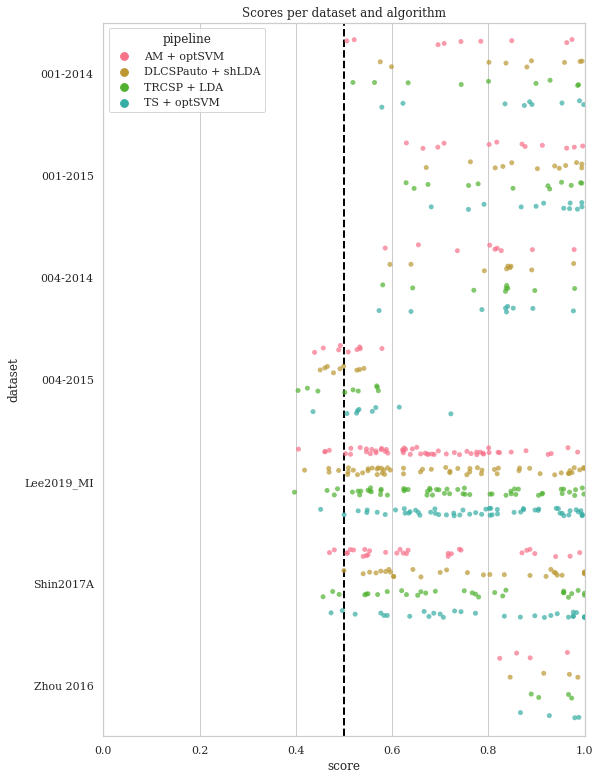

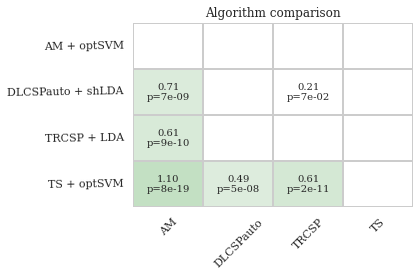

In [ ]:
analyze(MImg_results_css, options["output"], name="MI_cross_session", plot=options["plot"])

FBMI - making the edit to remove param querying n_chan to dataset search

In [ ]:
#@title FBMI

In [ ]:
# Munich MI crashes FBMI - Remove and run for now - Provide list of datasets to Eval
paradigm = "FilterBankMotorImagery"
print(paradigm)
print(context_params[paradigm])
log.debug("{}: {} ".format(paradigm, context_params[paradigm]))
print("{}: {} ".format(paradigm, context_params[paradigm]))
p = getattr(moabb_paradigms, paradigm)(**context_params[paradigm])
print(f"p {p}")
d = p.datasets
for i,dat in enumerate(d):
  print(i,dat)


Choosing from all possible events


FilterBankMotorImagery
{}
FilterBankMotorImagery: {} 
p <moabb.paradigms.motor_imagery.FilterBankMotorImagery object at 0x7ff8f043c110>
0 <moabb.datasets.alex_mi.AlexMI object at 0x7ff8f043c290>
1 <moabb.datasets.bnci.BNCI2014001 object at 0x7ff8f043c0d0>
2 <moabb.datasets.bnci.BNCI2014002 object at 0x7ff8f043c050>
3 <moabb.datasets.bnci.BNCI2014004 object at 0x7ff8f043c250>
4 <moabb.datasets.bnci.BNCI2015001 object at 0x7ff8f043c350>
5 <moabb.datasets.bnci.BNCI2015004 object at 0x7ff8f043c210>
6 <moabb.datasets.gigadb.Cho2017 object at 0x7ff8f043c2d0>
7 <moabb.datasets.Lee2019.Lee2019_MI object at 0x7ff8f043ca90>
8 <moabb.datasets.mpi_mi.MunichMI object at 0x7ff8f043c390>
9 <moabb.datasets.upper_limb.Ofner2017 object at 0x7ff8f043c550>
10 <moabb.datasets.physionet_mi.PhysionetMI object at 0x7ff8f043c090>
11 <moabb.datasets.schirrmeister2017.Schirrmeister2017 object at 0x7ff8f043c8d0>
12 <moabb.datasets.bbci_eeg_fnirs.Shin2017A object at 0x7ff8f043c150>
13 <moabb.datasets.Weibo2014.Wei

In [ ]:
d.pop(11) # SCHIRRMEISTER2017
d.pop(8) # Munich MI
for i,dat in enumerate(d):
  print(i,dat)

0 <moabb.datasets.alex_mi.AlexMI object at 0x7ff8f043c290>
1 <moabb.datasets.bnci.BNCI2014001 object at 0x7ff8f043c0d0>
2 <moabb.datasets.bnci.BNCI2014002 object at 0x7ff8f043c050>
3 <moabb.datasets.bnci.BNCI2014004 object at 0x7ff8f043c250>
4 <moabb.datasets.bnci.BNCI2015001 object at 0x7ff8f043c350>
5 <moabb.datasets.bnci.BNCI2015004 object at 0x7ff8f043c210>
6 <moabb.datasets.gigadb.Cho2017 object at 0x7ff8f043c2d0>
7 <moabb.datasets.Lee2019.Lee2019_MI object at 0x7ff8f043ca90>
8 <moabb.datasets.upper_limb.Ofner2017 object at 0x7ff8f043c550>
9 <moabb.datasets.physionet_mi.PhysionetMI object at 0x7ff8f043c090>
10 <moabb.datasets.bbci_eeg_fnirs.Shin2017A object at 0x7ff8f043c150>
11 <moabb.datasets.Weibo2014.Weibo2014 object at 0x7ff8f043ce50>
12 <moabb.datasets.Zhou2016.Zhou2016 object at 0x7ff8f043cd50>


In [ ]:
paradigm = "FilterBankMotorImagery"
print(paradigm)
print(context_params[paradigm])
log.debug("{}: {} Cross Session".format(paradigm, context_params[paradigm]))
print("{}: {} Cross Session".format(paradigm, context_params[paradigm]))
p = getattr(moabb_paradigms, paradigm)(**context_params[paradigm])
print(f"p {p}")
context_css = CrossSessionEvaluation(paradigm=p, random_state=42, 
                                      datasets = d,
                                      n_jobs=options["threads"], 
                                      overwrite=options["force"]
                                      )
# The overwrite param here is for the results file
print(context_css)
FBMImg_results_css = context_css.process(pipelines=paradigms[paradigm])
print(f"{paradigm} results_css {FBMImg_results_css}")

Choosing from all possible events
<moabb.datasets.alex_mi.AlexMI object at 0x7ff8f043c290> not compatible with evaluation. Removing this dataset from the list.
<moabb.datasets.bnci.BNCI2014002 object at 0x7ff8f043c050> not compatible with evaluation. Removing this dataset from the list.
<moabb.datasets.gigadb.Cho2017 object at 0x7ff8f043c2d0> not compatible with evaluation. Removing this dataset from the list.
<moabb.datasets.upper_limb.Ofner2017 object at 0x7ff8f043c550> not compatible with evaluation. Removing this dataset from the list.
<moabb.datasets.physionet_mi.PhysionetMI object at 0x7ff8f043c090> not compatible with evaluation. Removing this dataset from the list.
<moabb.datasets.Weibo2014.Weibo2014 object at 0x7ff8f043ce50> not compatible with evaluation. Removing this dataset from the list.


FilterBankMotorImagery
{}
FilterBankMotorImagery: {} Cross Session
p <moabb.paradigms.motor_imagery.FilterBankMotorImagery object at 0x7ff8f03e6290>


/usr/local/lib/python3.7/dist-packages/moabb/datasets/download.py:53: RuntimeWarning: Setting non-standard config type: "MNE_DATASETS_BNCI_PATH"
  set_config(key, get_config("MNE_DATA"))
/usr/local/lib/python3.7/dist-packages/moabb/datasets/download.py:53: RuntimeWarning: Setting non-standard config type: "MNE_DATASETS_LEE2019_MI_PATH"
  set_config(key, get_config("MNE_DATA"))


Reading 0 ... 305029  =      0.000 ...  1220.116 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 430479  =      0.000 ...  1721.916 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 252599  =      0.000 ...  1010.396 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 296649  =      0.000 ...  1186.596 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/mne/io/cnt/cnt.py:241: RuntimeWarning: overflow encountered in int_scalars
  data_size // (n_samples * n_channels) not in [2, 4]):
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 233249  =      0.000 ...   932.996 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 226219  =      0.000 ...   904.876 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 227539  =      0.000 ...   910.156 secs...


/usr/local/lib/python3.7/dist-packages/mne/io/cnt/cnt.py:241: RuntimeWarning: overflow encountered in int_scalars
  data_size // (n_samples * n_channels) not in [2, 4]):
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 216079  =      0.000 ...   864.316 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 213939  =      0.000 ...   855.756 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 175269  =      0.000 ...   701.076 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 213209  =      0.000 ...   852.836 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 217659  =      0.000 ...   870.636 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 219849  =      0.000 ...   879.396 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 216709  =      0.000 ...   866.836 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 226609  =      0.000 ...   906.436 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 266929  =      0.000 ...  1067.716 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 227989  =      0.000 ...   911.956 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 222459  =      0.000 ...   889.836 secs...


/usr/local/lib/python3.7/dist-packages/mne/io/cnt/cnt.py:241: RuntimeWarning: overflow encountered in int_scalars
  data_size // (n_samples * n_channels) not in [2, 4]):
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 181339  =      0.000 ...   725.356 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 217139  =      0.000 ...   868.556 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 215399  =      0.000 ...   861.596 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 212209  =      0.000 ...   848.836 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning:   Could not parse meas date from the header. Setting to None.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])
/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 209799  =      0.000 ...   839.196 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


Reading 0 ... 217109  =      0.000 ...   868.436 secs...


/usr/local/lib/python3.7/dist-packages/moabb/datasets/Zhou2016.py:102: RuntimeWarning: Could not define the number of bytes automatically. Defaulting to 2.
  raw = read_raw_cnt(fname, preload=True, eog=["VEOU", "VEOL"])


FilterBankMotorImagery results_css         score      time  samples  ... n_sessions    dataset        pipeline
0    0.969136  1.622126    144.0  ...          2   001-2014  FBCSP + optSVM
1    0.981481  1.321448    144.0  ...          2   001-2014  FBCSP + optSVM
2    0.488619  1.741443    144.0  ...          2   001-2014  FBCSP + optSVM
3    0.556906  1.464861    144.0  ...          2   001-2014  FBCSP + optSVM
4    0.998071  1.450304    144.0  ...          2   001-2014  FBCSP + optSVM
..        ...       ...      ...  ...        ...        ...             ...
311  0.985200  1.400045    200.0  ...          3  Zhou 2016  FBCSP + optSVM
312  0.986800  1.433290    200.0  ...          3  Zhou 2016  FBCSP + optSVM
313  0.919012  1.457185    200.0  ...          3  Zhou 2016  FBCSP + optSVM
314  0.914400  1.393518    190.0  ...          3  Zhou 2016  FBCSP + optSVM
315  0.974000  1.360516    190.0  ...          3  Zhou 2016  FBCSP + optSVM

[316 rows x 9 columns]


In [ ]:
print(FBMImg_results_css)

        score      time  samples  ... n_sessions    dataset        pipeline
0    0.969136  1.622126    144.0  ...          2   001-2014  FBCSP + optSVM
1    0.981481  1.321448    144.0  ...          2   001-2014  FBCSP + optSVM
2    0.488619  1.741443    144.0  ...          2   001-2014  FBCSP + optSVM
3    0.556906  1.464861    144.0  ...          2   001-2014  FBCSP + optSVM
4    0.998071  1.450304    144.0  ...          2   001-2014  FBCSP + optSVM
..        ...       ...      ...  ...        ...        ...             ...
311  0.985200  1.400045    200.0  ...          3  Zhou 2016  FBCSP + optSVM
312  0.986800  1.433290    200.0  ...          3  Zhou 2016  FBCSP + optSVM
313  0.919012  1.457185    200.0  ...          3  Zhou 2016  FBCSP + optSVM
314  0.914400  1.393518    190.0  ...          3  Zhou 2016  FBCSP + optSVM
315  0.974000  1.360516    190.0  ...          3  Zhou 2016  FBCSP + optSVM

[316 rows x 9 columns]


['FBCSP']
{'FBCSP'}


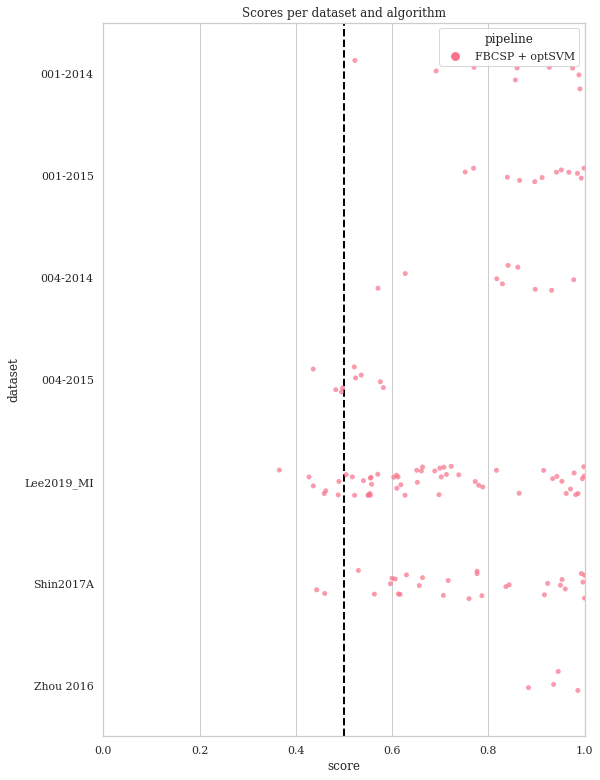

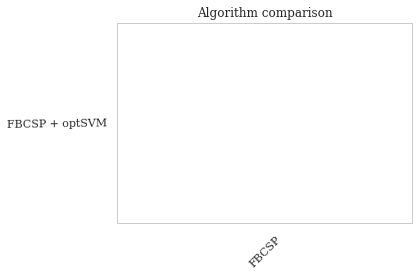

In [ ]:
analyze(FBMImg_results_css, options["output"], name="FBMI_cross_session", plot=options["plot"])

In [ ]:
#@title Combine Motor Imagery

In [ ]:
#@title SSVEP
# Change the CV to 4 - Hard coded - Raise Issue


In [ ]:
paradigm = "SSVEP"
print(paradigm)
print(context_params[paradigm])
log.debug("{}: {} ".format(paradigm, context_params[paradigm]))
print("{}: {} ".format(paradigm, context_params[paradigm]))
p = getattr(moabb_paradigms, paradigm)(**context_params[paradigm])
print(f"p {p}")
d = p.datasets
for i,dat in enumerate(d):
  print(i,dat)


Choosing the first None classes from all possible events


SSVEP
{}
SSVEP: {} 
p <moabb.paradigms.ssvep.SSVEP object at 0x7ff8e13921d0>
0 <moabb.datasets.Lee2019.Lee2019_SSVEP object at 0x7ff8e1392310>
1 <moabb.datasets.ssvep_mamem.MAMEM1 object at 0x7ff8e13926d0>
2 <moabb.datasets.ssvep_mamem.MAMEM2 object at 0x7ff8e1392a90>
3 <moabb.datasets.ssvep_mamem.MAMEM3 object at 0x7ff8e1392750>
4 <moabb.datasets.ssvep_nakanishi.Nakanishi2015 object at 0x7ff8e139b9d0>
5 <moabb.datasets.ssvep_exo.SSVEPExo object at 0x7ff8e139b490>
6 <moabb.datasets.ssvep_wang.Wang2016 object at 0x7ff8e139bbd0>


In [ ]:
d.pop(3) 
d.pop(2)
d.pop(1) 
for i,dat in enumerate(d):
  print(i,dat)

0 <moabb.datasets.Lee2019.Lee2019_SSVEP object at 0x7ff8e1392310>
1 <moabb.datasets.ssvep_nakanishi.Nakanishi2015 object at 0x7ff8e139b9d0>
2 <moabb.datasets.ssvep_exo.SSVEPExo object at 0x7ff8e139b490>
3 <moabb.datasets.ssvep_wang.Wang2016 object at 0x7ff8e139bbd0>


In [ ]:
paradigm = "SSVEP"
print(paradigm)
print(context_params[paradigm])
log.debug("{}: {} Cross Session".format(paradigm, context_params[paradigm]))
print("{}: {} Cross Session".format(paradigm, context_params[paradigm]))
p = getattr(moabb_paradigms, paradigm)(**context_params[paradigm])
print(f"p {p}")
context_css = CrossSessionEvaluation(paradigm=p, random_state=42, 
                                      datasets = d,
                                      n_jobs=options["threads"], 
                                      overwrite=options["force"]
                                      )
# The overwrite param here is for the results file
print(context_css)
SSVEP_results_css = context_css.process(pipelines=paradigms[paradigm])
print(f"{paradigm} results_css {SSVEP_results_css}")

Choosing the first None classes from all possible events
<moabb.datasets.ssvep_nakanishi.Nakanishi2015 object at 0x7ff8e139b9d0> not compatible with evaluation. Removing this dataset from the list.
<moabb.datasets.ssvep_exo.SSVEPExo object at 0x7ff8e139b490> not compatible with evaluation. Removing this dataset from the list.
<moabb.datasets.ssvep_wang.Wang2016 object at 0x7ff8e139bbd0> not compatible with evaluation. Removing this dataset from the list.


SSVEP
{}
SSVEP: {} Cross Session
p <moabb.paradigms.ssvep.SSVEP object at 0x7ff8e1418d90>


/usr/local/lib/python3.7/dist-packages/sklearn/cross_decomposition/_pls.py:97: ConvergenceWarning: Maximum number of iterations reached
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/cross_decomposition/_pls.py:97: ConvergenceWarning: Maximum number of iterations reached
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/cross_decomposition/_pls.py:97: ConvergenceWarning: Maximum number of iterations reached
  ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/cross_decomposition/_pls.py:97: ConvergenceWarning: Maximum number of iterations reached
  ConvergenceWarning)


SSVEP results_css      score       time  samples  ... n_sessions        dataset   pipeline
0     0.26  18.757233    100.0  ...          2  Lee2019_SSVEP  SSVEP CCA
1     0.25  19.822117    100.0  ...          2  Lee2019_SSVEP  SSVEP CCA
2     0.19  20.494045    100.0  ...          2  Lee2019_SSVEP  SSVEP CCA
3     0.18  18.325146    100.0  ...          2  Lee2019_SSVEP  SSVEP CCA
4     0.26  19.117327    100.0  ...          2  Lee2019_SSVEP  SSVEP CCA
..     ...        ...      ...  ...        ...            ...        ...
103   0.26  20.125711    100.0  ...          2  Lee2019_SSVEP  SSVEP CCA
104   0.17  20.693684    100.0  ...          2  Lee2019_SSVEP  SSVEP CCA
105   0.27  21.208368    100.0  ...          2  Lee2019_SSVEP  SSVEP CCA
106   0.22  18.869883    100.0  ...          2  Lee2019_SSVEP  SSVEP CCA
107   0.23  19.534645    100.0  ...          2  Lee2019_SSVEP  SSVEP CCA

[108 rows x 9 columns]


In [ ]:
print(SSVEP_results_css)

     score       time  samples  ... n_sessions        dataset   pipeline
0     0.26  18.757233    100.0  ...          2  Lee2019_SSVEP  SSVEP CCA
1     0.25  19.822117    100.0  ...          2  Lee2019_SSVEP  SSVEP CCA
2     0.19  20.494045    100.0  ...          2  Lee2019_SSVEP  SSVEP CCA
3     0.18  18.325146    100.0  ...          2  Lee2019_SSVEP  SSVEP CCA
4     0.26  19.117327    100.0  ...          2  Lee2019_SSVEP  SSVEP CCA
..     ...        ...      ...  ...        ...            ...        ...
103   0.26  20.125711    100.0  ...          2  Lee2019_SSVEP  SSVEP CCA
104   0.17  20.693684    100.0  ...          2  Lee2019_SSVEP  SSVEP CCA
105   0.27  21.208368    100.0  ...          2  Lee2019_SSVEP  SSVEP CCA
106   0.22  18.869883    100.0  ...          2  Lee2019_SSVEP  SSVEP CCA
107   0.23  19.534645    100.0  ...          2  Lee2019_SSVEP  SSVEP CCA

[108 rows x 9 columns]


['SSVEP CCA']
{'SSVEP CCA'}


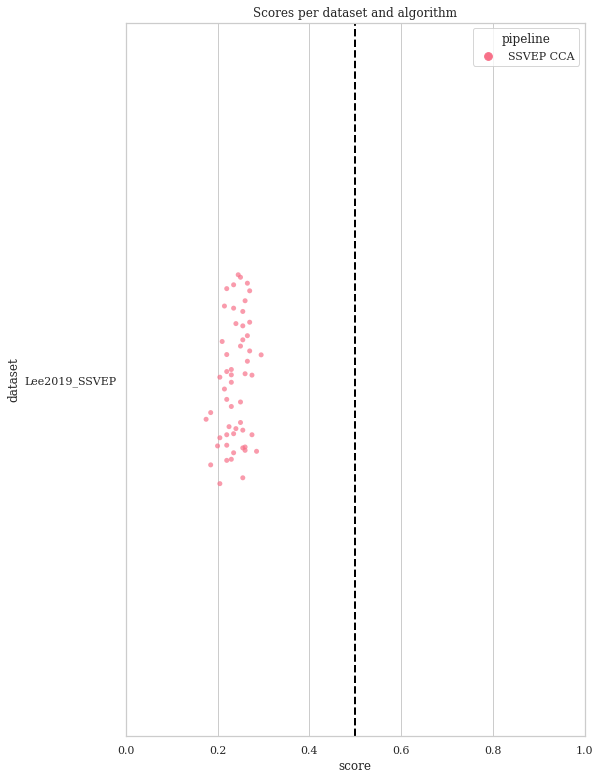

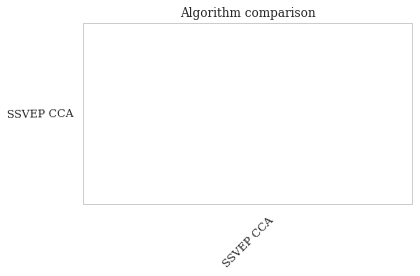

In [ ]:
analyze(SSVEP_results_css, options["output"], name="SSVEP_cross_session", plot=options["plot"])

In [ ]:
#@title FilterBank SSVEP

In [ ]:
paradigm = "FilterBankSSVEP"
print(paradigm)
print(context_params[paradigm])
log.debug("{}: {} ".format(paradigm, context_params[paradigm]))
print("{}: {} ".format(paradigm, context_params[paradigm]))
p = getattr(moabb_paradigms, paradigm)(**context_params[paradigm])
print(f"p {p}")
d = p.datasets
for i,dat in enumerate(d):
  print(i,dat)

Choosing the first None classes from all possible events


FilterBankSSVEP
{}
FilterBankSSVEP: {} 
p <moabb.paradigms.ssvep.FilterBankSSVEP object at 0x7ff8e1b1f250>
0 <moabb.datasets.Lee2019.Lee2019_SSVEP object at 0x7ff8e142c7d0>
1 <moabb.datasets.ssvep_mamem.MAMEM1 object at 0x7ff8df7d2450>
2 <moabb.datasets.ssvep_mamem.MAMEM2 object at 0x7ff8e12cdcd0>
3 <moabb.datasets.ssvep_mamem.MAMEM3 object at 0x7ff8e10a9dd0>
4 <moabb.datasets.ssvep_nakanishi.Nakanishi2015 object at 0x7ff8df830dd0>
5 <moabb.datasets.ssvep_exo.SSVEPExo object at 0x7ff8df8309d0>
6 <moabb.datasets.ssvep_wang.Wang2016 object at 0x7ff8df830c10>


In [ ]:
d.pop(3) 
d.pop(2)
d.pop(1) 
for i,dat in enumerate(d):
  print(i,dat)

0 <moabb.datasets.Lee2019.Lee2019_SSVEP object at 0x7ff8e142c7d0>
1 <moabb.datasets.ssvep_nakanishi.Nakanishi2015 object at 0x7ff8df830dd0>
2 <moabb.datasets.ssvep_exo.SSVEPExo object at 0x7ff8df8309d0>
3 <moabb.datasets.ssvep_wang.Wang2016 object at 0x7ff8df830c10>


In [ ]:
paradigm = "FilterBankSSVEP"
print(paradigm)
print(context_params[paradigm])
log.debug("{}: {} Cross Session".format(paradigm, context_params[paradigm]))
print("{}: {} Cross Session".format(paradigm, context_params[paradigm]))
p = getattr(moabb_paradigms, paradigm)(**context_params[paradigm])
print(f"p {p}")
context_css = CrossSessionEvaluation(paradigm=p, random_state=42, 
                                      datasets = d,
                                      n_jobs=options["threads"], 
                                      overwrite=options["force"]
                                      )
# The overwrite param here is for the results file
print(context_css)
FBSSVEP_results_css = context_css.process(pipelines=paradigms[paradigm])
print(f"{paradigm} results_css {FBSSVEP_results_css}")

Choosing the first None classes from all possible events
<moabb.datasets.ssvep_nakanishi.Nakanishi2015 object at 0x7ff8df830dd0> not compatible with evaluation. Removing this dataset from the list.
<moabb.datasets.ssvep_exo.SSVEPExo object at 0x7ff8df8309d0> not compatible with evaluation. Removing this dataset from the list.
<moabb.datasets.ssvep_wang.Wang2016 object at 0x7ff8df830c10> not compatible with evaluation. Removing this dataset from the list.


FilterBankSSVEP
{}
FilterBankSSVEP: {} Cross Session
p <moabb.paradigms.ssvep.FilterBankSSVEP object at 0x7ff8e106cf10>
FilterBankSSVEP results_css      score       time  samples subject    session  channels  n_sessions  \
0     0.64  73.454842    100.0       1  session_1        62           2   
1     0.67  70.453392    100.0       1  session_2        62           2   
2     0.58  68.250244    100.0       2  session_1        62           2   
3     0.50  69.085999    100.0       2  session_2        62           2   
4     0.62  77.909973    100.0       3  session_1        62           2   
..     ...        ...      ...     ...        ...       ...         ...   
318   0.59  60.761944    100.0      52  session_2        62           2   
319   0.91  58.261520    100.0      53  session_1        62           2   
320   0.96  61.929482    100.0      53  session_2        62           2   
321   0.80  61.220863    100.0      54  session_1        62           2   
322   0.78  76.364670    10

In [ ]:
print(FBSSVEP_results_css)

     score       time  samples subject    session  channels  n_sessions  \
0     0.64  73.454842    100.0       1  session_1        62           2   
1     0.67  70.453392    100.0       1  session_2        62           2   
2     0.58  68.250244    100.0       2  session_1        62           2   
3     0.50  69.085999    100.0       2  session_2        62           2   
4     0.62  77.909973    100.0       3  session_1        62           2   
..     ...        ...      ...     ...        ...       ...         ...   
318   0.59  60.761944    100.0      52  session_2        62           2   
319   0.91  58.261520    100.0      53  session_1        62           2   
320   0.96  61.929482    100.0      53  session_2        62           2   
321   0.80  61.220863    100.0      54  session_1        62           2   
322   0.78  76.364670    100.0      54  session_2        62           2   

           dataset                 pipeline  
0    Lee2019_SSVEP                MDM-SSVEP  
1    Le

Pipeline names are too similar, turning off name shortening


['MDM-SSVEP', 'SSVEP', 'SSVEP']
{'SSVEP', 'MDM-SSVEP'}


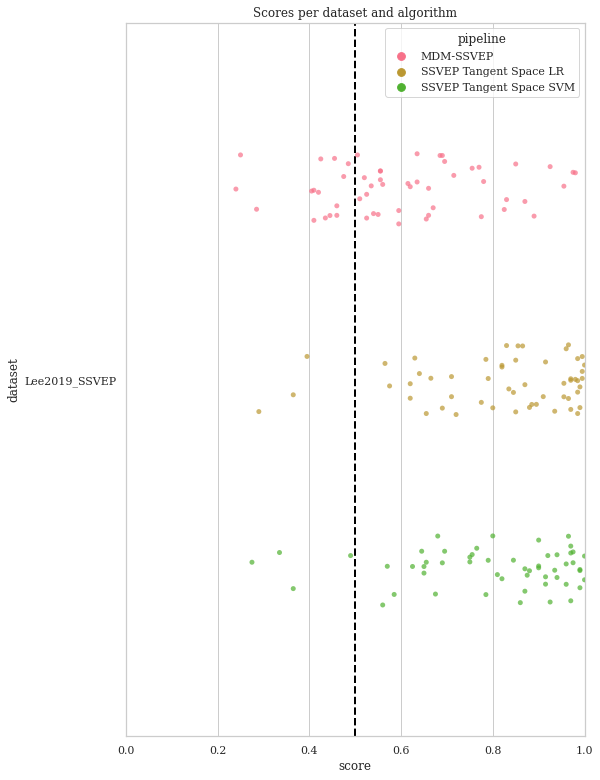

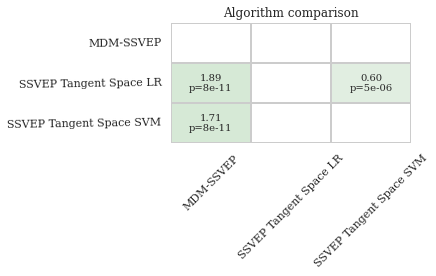

In [ ]:
analyze(FBSSVEP_results_css, options["output"], name="FBSSVEP_cross_session", plot=options["plot"])

In [ ]:
#@title Combine SSVEP

# Cross-Subject

In [ ]:
pd.set_option('display.max_columns', None)

In [ ]:
#@title LeftRightImagery

In [ ]:
# GIGADB crashes RAM
paradigm = "LeftRightImagery"
print(paradigm)
print(context_params[paradigm])
log.debug("{}: {} Cross Subject".format(paradigm, context_params[paradigm]))
print("{}: {} Cross Subject".format(paradigm, context_params[paradigm]))
p = getattr(moabb_paradigms, paradigm)(**context_params[paradigm])
print(f"p {p}")
context_csu = CrossSubjectEvaluation(paradigm=p, random_state=42, 
                                      n_jobs=options["threads"], 
                                      overwrite=options["force"]
                                      )
# The overwrite param here is for the results file
print(context_csu)
LRImg_results_csu = context_csu.process(pipelines=paradigms[paradigm])
print(f"{paradigm} results_csu {LRImg_results_csu}")

LeftRightImagery
{}
LeftRightImagery: {} Cross Subject
p <moabb.paradigms.motor_imagery.LeftRightImagery object at 0x7fbec3379e90>


/usr/local/lib/python3.7/dist-packages/moabb/datasets/download.py:53: RuntimeWarning: Setting non-standard config type: "MNE_DATASETS_GIGADB_PATH"
  set_config(key, get_config("MNE_DATA"))
Trials demeaned and stacked with zero buffer to create continuous data -- edge effects present
Trials demeaned and stacked with zero buffer to create continuous data -- edge effects present
Trials demeaned and stacked with zero buffer to create continuous data -- edge effects present
Trials demeaned and stacked with zero buffer to create continuous data -- edge effects present
Trials demeaned and stacked with zero buffer to create continuous data -- edge effects present
Trials demeaned and stacked with zero buffer to create continuous data -- edge effects present
Trials demeaned and stacked with zero buffer to create continuous data -- edge effects present
Trials demeaned and stacked with zero buffer to create continuous data -- edge effects present
Trials demeaned and stacked with zero buffer to cre

In [ ]:
print(LRImg_results_csu)

In [ ]:
analyze(LRImg_results_csu, options["output"], name="LRI_cross_subject", plot=options["plot"])

In [ ]:
#@title Motor Imagery

In [ ]:
# BNCI crashed RAM in cross subject
paradigm = "MotorImagery"
print(paradigm)
print(context_params[paradigm])
log.debug("{}: {} Cross Subject".format(paradigm, context_params[paradigm]))
print("{}: {} Cross Subject".format(paradigm, context_params[paradigm]))
p = getattr(moabb_paradigms, paradigm)(**context_params[paradigm])
print(f"p {p}")
context_csu = CrossSubjectEvaluation(paradigm=p, random_state=42, 
                                      n_jobs=options["threads"], 
                                      overwrite=options["force"]
                                      )
# The overwrite param here is for the results file
print(context_csu)
MImg_results_csu = context_csu.process(pipelines=paradigms[paradigm])
print(f"{paradigm} results_csu {MImg_results_csu}")


# all_results_ws.append(results_ws)

Choosing from all possible events


MotorImagery
{}
MotorImagery: {} Cross Subject
p <moabb.paradigms.motor_imagery.MotorImagery object at 0x7f5728547ad0>


/usr/local/lib/python3.7/dist-packages/moabb/datasets/download.py:53: RuntimeWarning: Setting non-standard config type: "MNE_DATASETS_ALEXEEG_PATH"
  set_config(key, get_config("MNE_DATA"))
/usr/local/lib/python3.7/dist-packages/moabb/datasets/download.py:53: RuntimeWarning: Setting non-standard config type: "MNE_DATASETS_BNCI_PATH"
  set_config(key, get_config("MNE_DATA"))
Trials demeaned and stacked with zero buffer to create continuous data -- edge effects present
Trials demeaned and stacked with zero buffer to create continuous data -- edge effects present
Trials demeaned and stacked with zero buffer to create continuous data -- edge effects present
Trials demeaned and stacked with zero buffer to create continuous data -- edge effects present
Trials demeaned and stacked with zero buffer to create continuous data -- edge effects present
Trials demeaned and stacked with zero buffer to create continuous data -- edge effects present
Trials demeaned and stacked with zero buffer to creat

In [ ]:
print(MImg_results_csu)

In [ ]:
analyze(MImg_results_csu, options["output"], name="MI_cross_subject", plot=options["plot"])

FBMI - making the edit to remove param querying n_chan to dataset search

In [ ]:
#@title FBMI

In [ ]:
# Munich MI crashes FBMI - Remove and run for now - Provide list of datasets to Eval
paradigm = "FilterBankMotorImagery"
print(paradigm)
print(context_params[paradigm])
log.debug("{}: {} ".format(paradigm, context_params[paradigm]))
print("{}: {} ".format(paradigm, context_params[paradigm]))
p = getattr(moabb_paradigms, paradigm)(**context_params[paradigm])
print(f"p {p}")
d = p.datasets
for i,dat in enumerate(d):
  print(i,dat)


In [ ]:
d.pop(11) # SCHIRRMEISTER2017
d.pop(8) # Munich MI
for i,dat in enumerate(d):
  print(i,dat)

In [ ]:
paradigm = "FilterBankMotorImagery"
print(paradigm)
print(context_params[paradigm])
log.debug("{}: {} Cross Subject".format(paradigm, context_params[paradigm]))
print("{}: {} Cross Subject".format(paradigm, context_params[paradigm]))
p = getattr(moabb_paradigms, paradigm)(**context_params[paradigm])
print(f"p {p}")
context_csu = CrossSubjectEvaluation(paradigm=p, random_state=42, 
                                      n_jobs=options["threads"], 
                                      overwrite=options["force"]
                                      )
# The overwrite param here is for the results file
print(context_csu)
FBMImg_results_csu = context_csu.process(pipelines=paradigms[paradigm])
print(f"{paradigm} results_csu {FBMImg_results_csu}")

In [ ]:
print(FBMImg_results_csu)

In [ ]:
analyze(FBMImg_results_csu, options["output"], name="FBMI_cross_subject", plot=options["plot"])

In [ ]:
#@title SSVEP
# Change the CV to 4 - Hard coded - Raise Issue


In [ ]:
paradigm = "SSVEP"
print(paradigm)
print(context_params[paradigm])
log.debug("{}: {} Within Session".format(paradigm, context_params[paradigm]))
print("{}: {} Within Session".format(paradigm, context_params[paradigm]))
p = getattr(moabb_paradigms, paradigm)(**context_params[paradigm])
print(f"p {p}")
d = p.datasets
for i,dat in enumerate(d):
  print(i,dat)


In [ ]:
paradigm = "SSVEP"
print(paradigm)
print(context_params[paradigm])
log.debug("{}: {} Cross Subject".format(paradigm, context_params[paradigm]))
print("{}: {} Cross Subject".format(paradigm, context_params[paradigm]))
p = getattr(moabb_paradigms, paradigm)(**context_params[paradigm])
print(f"p {p}")
context_csu = CrossSubjectEvaluation(paradigm=p, random_state=42, 
                                      n_jobs=options["threads"], 
                                      overwrite=options["force"]
                                      )
# The overwrite param here is for the results file
print(context_csu)
SSVEP_results_csu = context_csu.process(pipelines=paradigms[paradigm])
print(f"{paradigm} results_css {SSVEP_results_csu}")

In [ ]:
print(SSVEP_results_csu)

In [ ]:
analyze(SSVEP_results_csu, options["output"], name="SSVEP_cross_subject", plot=options["plot"])

In [ ]:
#@title FilterBank SSVEP

In [ ]:
paradigm = "FilterBankSSVEP"
print(paradigm)
print(context_params[paradigm])
log.debug("{}: {} ".format(paradigm, context_params[paradigm]))
print("{}: {} ".format(paradigm, context_params[paradigm]))
p = getattr(moabb_paradigms, paradigm)(**context_params[paradigm])
print(f"p {p}")
d = p.datasets
for i,dat in enumerate(d):
  print(i,dat)

In [ ]:
d.pop(3) 
d.pop(2)
d.pop(1) 
for i,dat in enumerate(d):
  print(i,dat)

In [ ]:
paradigm = "FilterBankSSVEP"
print(paradigm)
print(context_params[paradigm])
log.debug("{}: {} Cross Subject".format(paradigm, context_params[paradigm]))
print("{}: {} Cross Subject".format(paradigm, context_params[paradigm]))
p = getattr(moabb_paradigms, paradigm)(**context_params[paradigm])
print(f"p {p}")
context_csu = CrossSubjectEvaluation(paradigm=p, random_state=42, 
                                      n_jobs=options["threads"], 
                                      overwrite=options["force"]
                                      )
# The overwrite param here is for the results file
print(context_csu)
FBSSVEP_results_csu = context_csu.process(pipelines=paradigms[paradigm])
print(f"{paradigm} results_css {FBSSVEP_results_csu}")


# all_results_ws.append(results_ws)

In [ ]:
print(FBSSVEP_results_csu)

In [ ]:
analyze(FBSSVEP_results_csu, options["output"], name="FBSSVEP_cross_subject", plot=options["plot"])

# Everything below is Debugging/Miscellaneous Stuff

# Old try Within Session

In [ ]:
#@title
# paradigm = paradigms['LeftRightImagery']
# print(paradigm)
# liblinear problem logreg
for paradigm in paradigms:
  s = time.time()
  print(paradigm)
  print(context_params[paradigm])
  log.debug("{}: {} Within Session".format(paradigm, context_params[paradigm]))
  print("{}: {} Within Session".format(paradigm, context_params[paradigm]))
  p = getattr(moabb_paradigms, paradigm)(**context_params[paradigm])
  print(f"p {p}")
  context_ws = WithinSessionEvaluation(paradigm=p, random_state=42, 
                                       n_jobs=options["threads"], 
                                       overwrite=options["force"]
                                       )
  # The overwrite param here is for the results file
  print(context_ws)
  results_ws = context_ws.process(pipelines=paradigms[paradigm])
  print(f"results_ws {results_ws}")
  e = time.time()
  print(f"paradigm {paradigm}, processing time = {(e-s)} seconds")


  all_results_ws.append(results_ws)

Points of note - 
1. While sklearn gave the cv split data has only 4 points while 5 splits are required, it is not clear if it still ran or not
2. Need a more consistent and cleaner output and progress indication.
3. Add param solver to liblinear in the pipelines in moabb itself

In [ ]:
print(all_results_ws)

[         score      time  samples  ... n_sessions    dataset           pipeline
0     0.827143  0.251110    144.0  ...          2   001-2014   Log Variance LDA
1     0.826327  0.051268    144.0  ...          2   001-2014   Log Variance LDA
2     0.639456  0.060345    144.0  ...          2   001-2014   Log Variance LDA
3     0.578299  0.048697    144.0  ...          2   001-2014   Log Variance LDA
4     0.958095  0.050990    144.0  ...          2   001-2014   Log Variance LDA
...        ...       ...      ...  ...        ...        ...                ...
3691  0.988000  0.111476    100.0  ...          3  Zhou 2016  Tangent Space SVM
3692  0.998000  0.108539    100.0  ...          3  Zhou 2016  Tangent Space SVM
3693  0.997531  0.102040     90.0  ...          3  Zhou 2016  Tangent Space SVM
3694  0.978000  0.124515    100.0  ...          3  Zhou 2016  Tangent Space SVM
3695  0.962000  0.109058    100.0  ...          3  Zhou 2016  Tangent Space SVM

[3696 rows x 9 columns],          scor

In [ ]:
analyze(pd.concat(all_results_ws, ignore_index=True), options["output"], name="within_session", plot=options["plot"])

Pipeline names are too similar, turning off name shortening


['Log', 'CSP', 'MDM', 'CSP + SVM', 'CSP + LDA', 'Tangent', 'Log', 'Tangent', 'TRCSP', 'AM', 'TS', 'DLCSPauto']
{'CSP + SVM', 'MDM', 'Log', 'CSP', 'AM', 'DLCSPauto', 'Tangent', 'TRCSP', 'TS', 'CSP + LDA'}


AssertionError: ignored

In [ ]:
# all_results_ws.pi

In [ ]:
for paradigm in paradigms:
  print(paradigm)

LeftRightImagery
MotorImagery


# Debugging Analyze error

In [ ]:
from moabb.analysis.meta_analysis import collapse_session_scores

001-2015, 002-2014, 004-2015, Alexandre Motor Imagery have lesser than the specified pipelines - All these are motor imagery datasets

In [ ]:
ws_results_dict = pd.concat(all_results_ws, ignore_index=True)
ws_results_dict.pipeline.unique()

array(['Log Variance LDA', 'CSP + optSVM', 'MDM', 'CSP + SVM',
       'CSP + LDA', 'Tangent Space LR', 'Log Variance SVM',
       'Tangent Space SVM', 'TRCSP + LDA', 'AM + optSVM', 'TS + optSVM',
       'DLCSPauto + shLDA'], dtype=object)

In [ ]:
cols = ws_results_dict.columns
print(cols)

Index(['score', 'time', 'samples', 'subject', 'session', 'channels',
       'n_sessions', 'dataset', 'pipeline'],
      dtype='object')


In [ ]:
df = ws_results_dict
df = collapse_session_scores(df)
print(df.head)
algs = df.pipeline.unique()
print(algs)
dsets = df.dataset.unique()
print(dsets)

<bound method NDFrame.head of                pipeline     dataset subject     score      time     samples  \
0           AM + optSVM    001-2014       1  0.763231  0.159515  144.000000   
1           AM + optSVM    001-2014       2  0.512925  0.228336  144.000000   
2           AM + optSVM    001-2014       3  0.941633  0.151189  144.000000   
3           AM + optSVM    001-2014       4  0.663129  0.164245  144.000000   
4           AM + optSVM    001-2014       5  0.536565  0.165039  144.000000   
...                 ...         ...     ...       ...       ...         ...   
3791  Tangent Space SVM  Weibo 2014       9  0.906250  0.817217  160.000000   
3792  Tangent Space SVM   Zhou 2016       1  0.920764  0.116598  106.333336   
3793  Tangent Space SVM   Zhou 2016       2  0.863177  0.111429   96.666664   
3794  Tangent Space SVM   Zhou 2016       3  0.991333  0.109823  100.000000   
3795  Tangent Space SVM   Zhou 2016       4  0.979177  0.111871   96.666664   

      channels  n_ses

In [ ]:
for d in dsets:
        score_data = df[df.dataset == d].pivot(
            index="subject", values="score", columns="pipeline"
        )
        print(d)
        print(score_data.columns)

001-2014
Index(['AM + optSVM', 'CSP + LDA', 'CSP + SVM', 'CSP + optSVM',
       'DLCSPauto + shLDA', 'Log Variance LDA', 'Log Variance SVM', 'MDM',
       'TRCSP + LDA', 'TS + optSVM', 'Tangent Space LR', 'Tangent Space SVM'],
      dtype='object', name='pipeline')
001-2015
Index(['AM + optSVM', 'DLCSPauto + shLDA', 'TRCSP + LDA', 'TS + optSVM'], dtype='object', name='pipeline')
002-2014
Index(['AM + optSVM', 'DLCSPauto + shLDA', 'TRCSP + LDA', 'TS + optSVM'], dtype='object', name='pipeline')
004-2014
Index(['AM + optSVM', 'CSP + LDA', 'CSP + SVM', 'CSP + optSVM',
       'DLCSPauto + shLDA', 'Log Variance LDA', 'Log Variance SVM', 'MDM',
       'TRCSP + LDA', 'TS + optSVM', 'Tangent Space LR', 'Tangent Space SVM'],
      dtype='object', name='pipeline')
004-2015
Index(['AM + optSVM', 'DLCSPauto + shLDA', 'TRCSP + LDA', 'TS + optSVM'], dtype='object', name='pipeline')
Alexandre Motor Imagery
Index(['AM + optSVM', 'DLCSPauto + shLDA', 'TRCSP + LDA', 'TS + optSVM'], dtype='object', name='

In [ ]:
# Do the run for one of these datasets separately first now
paradigm = "MotorImagery"

# Old try Within Session Contd

In [ ]:
# paradigm = paradigms['LeftRightImagery']
# print(paradigm)
for paradigm in paradigms:
  s = time.time()
  print(paradigm)
  print(context_params[paradigm])
  log.debug("{}: {} Within Session".format(paradigm, context_params[paradigm]))
  print("{}: {} Within Session".format(paradigm, context_params[paradigm]))
  p = getattr(moabb_paradigms, paradigm)(**context_params[paradigm])
  print(f"p {p}")
  context_ws = WithinSessionEvaluation(paradigm=p, random_state=42, 
                                       n_jobs=options["threads"], 
                                       overwrite=options["force"]
                                       )
  # The overwrite param here is for the results file
  print(context_ws)
  results_ws = context_ws.process(pipelines=paradigms[paradigm])
  print(f"results_ws {results_ws}")


  all_results_ws.append(results_ws)
  e = time.time()
  print(f"paradigm {paradigm}, processing time = {(e-s)} seconds")

LeftRightImagery
{}
LeftRightImagery: {} Within Session
p <moabb.paradigms.motor_imagery.LeftRightImagery object at 0x7f499874f210>


Choosing from all possible events


results_ws          score      time  samples  ... n_sessions    dataset           pipeline
0     0.827143  0.251110    144.0  ...          2   001-2014   Log Variance LDA
1     0.826327  0.051268    144.0  ...          2   001-2014   Log Variance LDA
2     0.639456  0.060345    144.0  ...          2   001-2014   Log Variance LDA
3     0.578299  0.048697    144.0  ...          2   001-2014   Log Variance LDA
4     0.958095  0.050990    144.0  ...          2   001-2014   Log Variance LDA
...        ...       ...      ...  ...        ...        ...                ...
3691  0.988000  0.111476    100.0  ...          3  Zhou 2016  Tangent Space SVM
3692  0.998000  0.108539    100.0  ...          3  Zhou 2016  Tangent Space SVM
3693  0.997531  0.102040     90.0  ...          3  Zhou 2016  Tangent Space SVM
3694  0.978000  0.124515    100.0  ...          3  Zhou 2016  Tangent Space SVM
3695  0.962000  0.109058    100.0  ...          3  Zhou 2016  Tangent Space SVM

[3696 rows x 9 columns]
para

In [ ]:
pd.set_option('display.max_columns', None)
print(all_results_ws)

[         score      time  samples subject    session  channels  n_sessions  \
0     0.827143  0.251110    144.0       1  session_E        22           2   
1     0.826327  0.051268    144.0       1  session_T        22           2   
2     0.639456  0.060345    144.0       2  session_E        22           2   
3     0.578299  0.048697    144.0       2  session_T        22           2   
4     0.958095  0.050990    144.0       3  session_E        22           2   
...        ...       ...      ...     ...        ...       ...         ...   
3691  0.988000  0.111476    100.0       3  session_1        14           3   
3692  0.998000  0.108539    100.0       3  session_2        14           3   
3693  0.997531  0.102040     90.0       4  session_0        14           3   
3694  0.978000  0.124515    100.0       4  session_1        14           3   
3695  0.962000  0.109058    100.0       4  session_2        14           3   

        dataset           pipeline  
0      001-2014   Log Var

In [ ]:
analyze(pd.concat(all_results_ws, ignore_index=True), options["output"], name="within_session", plot=options["plot"])

Pipeline names are too similar, turning off name shortening


['Log', 'CSP', 'MDM', 'CSP + SVM', 'CSP + LDA', 'Tangent', 'Log', 'Tangent', 'TRCSP', 'AM', 'TS', 'DLCSPauto']
{'CSP + LDA', 'DLCSPauto', 'TRCSP', 'Log', 'Tangent', 'MDM', 'AM', 'CSP + SVM', 'TS', 'CSP'}


AssertionError: ignored

# Misc

In [ ]:
for paradigm in paradigms:
  print(paradigm)
  print(context_params[paradigm])
  log.debug("{}: {} Within Session".format(paradigm, context_params[paradigm]))
  print("{}: {} Within Session".format(paradigm, context_params[paradigm]))
  p = getattr(moabb_paradigms, paradigm)(**context_params[paradigm])
  print(f"p {p}")
  # Does Leave One Subject Out Cross Validation

  log.debug("{}: {} Cross Subject".format(paradigm, context_params[paradigm]))

  context_csu = CrossSubjectEvaluation(

      paradigm=p, random_state=42, n_jobs=options["threads"], overwrite=options["force"]

  )

  results_csu = context_csu.process(pipelines=paradigms[paradigm])

  all_results_csu.append(results_csu)

In [ ]:
print(all_results_csu)

In [ ]:
analyze(pd.concat(all_results_csu, ignore_index=True), options["output"], name="cross_subject", plot=options["plot"])

In [ ]:
paradigm = 'LeftRightImagery'
p = getattr(moabb_paradigms, paradigm)(**context_params[paradigm])

In [ ]:
p.datasets

In [ ]:
paradigm = "FilterBankMotorImagery"
p = getattr(moabb_paradigms, paradigm)(**context_params[paradigm])
p.datasets

Choosing from all possible events


TypeError: ignored